# Bank-Level EDA: Branch Records and Census Context

Dataset: eda_bank_level.csv


In [1]:
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option("display.max_columns", 180)
pd.set_option("display.max_rows", 140)
sns.set_style("whitegrid")
plt.rcParams.update({"figure.dpi": 100, "font.size": 11})

HERE = Path.cwd().resolve()
PROJECT_ROOT = HERE.parent if HERE.name == "notebooks" else HERE
DATA_DIR = PROJECT_ROOT / "data" / "processed"
BANK_FILE = DATA_DIR / "eda_bank_level.csv"
if not BANK_FILE.exists():
    raise FileNotFoundError("Run data_matching_procedure.ipynb first to create eda_bank_level.csv.")
OUTPUT_DIR = PROJECT_ROOT / "results"
FIG_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "eda_tables"
for folder in [OUTPUT_DIR, FIG_DIR, TABLE_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

print("Current folder:", HERE)
print("Output folder:", OUTPUT_DIR)


Current folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\notebooks
Output folder: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\results


## 1. Load Data and Create Analytical Variables

Load the matched branch records and derive census shares for each host area. Retain all recorded statuses for EDA and define a binary outcome only for realised open and closed records.


In [2]:
def safe_divide(numerator, denominator):
    numerator = pd.to_numeric(numerator, errors="coerce")
    denominator = pd.to_numeric(denominator, errors="coerce")
    return np.where(denominator > 0, numerator / denominator, np.nan)


def add_census_rates(df):
    """Create percentage variables for EDA only. The source CSV is not changed."""
    out = df.copy()

    # Demographic structure.
    for col in ["age_0_15", "age_16_24", "age_25_34", "age_35_49", "age_50_64", "age_65_plus"]:
        out[f"{col}_pct"] = safe_divide(out[col], out["population_total"])
    out["age_25_64_pct"] = safe_divide(
        out[["age_25_34", "age_35_49", "age_50_64"]].sum(axis=1), out["population_total"]
    )

    # Household deprivation and car availability.
    out["deprived_0_pct"] = safe_divide(out["deprived_0"], out["households_total"])
    out["deprived_1_pct"] = safe_divide(out["deprived_1"], out["households_total"])
    out["deprived_2_plus_pct"] = safe_divide(out["deprived_2_plus"], out["households_total"])
    out["cars_0_pct"] = safe_divide(out["cars_0"], out["car_households_total"])
    out["cars_1_pct"] = safe_divide(out["cars_1"], out["car_households_total"])
    out["cars_2_pct"] = safe_divide(out["cars_2"], out["car_households_total"])
    out["cars_3_plus_pct"] = safe_divide(out["cars_3_plus"], out["car_households_total"])
    out["cars_2_plus_pct"] = safe_divide(out["cars_2"] + out["cars_3_plus"], out["car_households_total"])

    # Health and disability.
    out["health_very_good_pct"] = safe_divide(out["health_very_good"], out["health_total"])
    out["health_good_pct"] = safe_divide(out["health_good"], out["health_total"])
    out["health_fair_pct"] = safe_divide(out["health_fair"], out["health_total"])
    out["health_bad_pct"] = safe_divide(out["health_bad"], out["health_total"])
    out["health_very_bad_pct"] = safe_divide(out["health_very_bad"], out["health_total"])
    out["health_bad_very_bad_pct"] = safe_divide(out["health_bad"] + out["health_very_bad"], out["health_total"])
    out["health_other_pct"] = safe_divide(
        out[["health_fair", "health_bad", "health_very_bad"]].sum(axis=1), out["health_total"]
    )
    out["disabled_pct"] = safe_divide(out["disabled"], out["disability_total"])
    out["not_disabled_pct"] = safe_divide(out["not_disabled"], out["disability_total"])

    # Economic activity.
    econ_den = out["economic_activity_total_16_plus"]
    for col in [
        "employee_part_time", "employee_full_time", "self_employed_part_time", "self_employed_full_time",
        "unemployed", "inactive_retired", "inactive_student", "inactive_home_family",
        "inactive_long_term_sick_disabled", "inactive_other"
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], econ_den)
    out["self_employed_total_pct"] = safe_divide(out["self_employed_part_time"] + out["self_employed_full_time"], econ_den)
    out["employed_total_pct"] = safe_divide(out[[
        "employee_part_time", "employee_full_time",
        "self_employed_part_time", "self_employed_full_time",
    ]].sum(axis=1), econ_den)
    out["inactive_other_total_pct"] = safe_divide(out[[
        "inactive_student", "inactive_home_family", "inactive_other",
    ]].sum(axis=1), econ_den)

    # Education.
    out["education_no_qualifications_pct"] = safe_divide(out["education_no_qualifications"], out["education_total_16_plus"])
    out["education_apprenticeship_pct"] = safe_divide(out["education_apprenticeship"], out["education_total_16_plus"])
    for col in ["education_low", "education_middle", "education_higher"]:
        out[f"{col}_pct"] = safe_divide(out[col], out["education_total_16_plus"])

    # NS-SEC.
    ns_den = out["nssec_total_16_plus"]
    for col in [
        "nssec_managerial_professional", "nssec_intermediate", "nssec_small_employers_own_account",
        "nssec_lower_supervisory_technical", "nssec_semi_routine_routine",
        "nssec_never_worked_long_term_unemployed", "nssec_full_time_students"
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], ns_den)
    out["nssec_managerial_professional_small_employers_pct"] = safe_divide(
        out["nssec_managerial_professional"] + out["nssec_small_employers_own_account"], ns_den
    )
    out["nssec_intermediate_lower_supervisory_pct"] = safe_divide(
        out["nssec_intermediate"] + out["nssec_lower_supervisory_technical"], ns_den
    )

    # Industry.
    ind_den = out["industry_total_with_code"]
    for col in [
        "industry_agriculture_energy_water", "industry_manufacturing", "industry_construction",
        "industry_distribution_hotels_restaurants", "industry_transport_communication",
        "industry_finance_real_estate_professional_admin", "industry_public_admin_education_health", "industry_other"
    ]:
        out[f"{col}_pct"] = safe_divide(out[col], ind_den)
    out["industry_production_pct"] = safe_divide(out[[
        "industry_agriculture_energy_water", "industry_manufacturing", "industry_construction",
    ]].sum(axis=1), ind_den)
    out["industry_distribution_transport_pct"] = safe_divide(out[[
        "industry_distribution_hotels_restaurants", "industry_transport_communication",
    ]].sum(axis=1), ind_den)
    out["industry_public_other_services_pct"] = safe_divide(out[[
        "industry_public_admin_education_health", "industry_other",
    ]].sum(axis=1), ind_den)

    return out


CENSUS_GROUPS = {
    "age": ["age_0_15_pct", "age_16_24_pct", "age_25_64_pct", "age_65_plus_pct"],
    "deprivation": ["deprived_0_pct", "deprived_1_pct", "deprived_2_plus_pct"],
    "car_availability": ["cars_0_pct", "cars_1_pct", "cars_2_plus_pct"],
    "health_disability": ["health_very_good_pct", "health_good_pct", "health_other_pct", "disabled_pct"],
    # Rudkin groups: Q1 None+L1; Q2 L2+apprenticeship; Q3 L3+L4.
    # Scotland uses the nearest available published qualification equivalents.
    "education": ["education_low_pct", "education_middle_pct", "education_higher_pct"],
    "nssec": ["nssec_managerial_professional_small_employers_pct", "nssec_intermediate_lower_supervisory_pct", "nssec_semi_routine_routine_pct", "nssec_never_worked_long_term_unemployed_pct"],
    "economic_activity": ["employed_total_pct", "unemployed_pct", "inactive_retired_pct", "inactive_long_term_sick_disabled_pct", "inactive_other_total_pct"],
    "industry": ["industry_production_pct", "industry_distribution_transport_pct", "industry_finance_real_estate_professional_admin_pct", "industry_public_other_services_pct"],
}

DISPLAY_LABELS = {
    "population_total": "Population",
    "households_total": "Households",
    "bank_count_open": "Open branch records",
    "bank_count_closed": "Closed branch records",
    "retained_provision": "Retained provision",
    "complete_withdrawal": "Complete withdrawal",
    "is_open": "Open branch",
    "is_closed": "Closed branch",
    "is_closing": "Closing branch",
    "age_0_15_pct": "Age: 0-15",
    "age_16_24_pct": "Age: 16-24",
    "age_25_64_pct": "Age: 25-64",
    "age_65_plus_pct": "Age: 65 and over",
    "deprived_0_pct": "Deprivation: no dimensions",
    "deprived_1_pct": "Deprivation: one dimension",
    "deprived_2_plus_pct": "Deprivation: two or more dimensions",
    "cars_0_pct": "Car access: no car",
    "cars_1_pct": "Car access: one car",
    "cars_2_plus_pct": "Car access: two or more cars",
    "health_very_good_pct": "Health: very good",
    "health_good_pct": "Health: good",
    "health_other_pct": "Health: fair, bad or very bad",
    "disabled_pct": "Disability: disabled",
    "education_low_pct": "Qualifications: Group 1 (none + Level 1)",
    "education_middle_pct": "Qualifications: Group 2 (Level 2 + apprenticeship)",
    "education_higher_pct": "Qualifications: Group 3 (Levels 3 and 4)",
    "nssec_managerial_professional_small_employers_pct": "NS-SEC: managerial, professional and small employers",
    "nssec_intermediate_lower_supervisory_pct": "NS-SEC: intermediate and lower supervisory",
    "nssec_semi_routine_routine_pct": "NS-SEC: semi-routine and routine",
    "nssec_never_worked_long_term_unemployed_pct": "NS-SEC: never worked or long-term unemployed",
    "employed_total_pct": "Economic activity: employed",
    "unemployed_pct": "Economic activity: unemployed",
    "inactive_retired_pct": "Economic inactivity: retired",
    "inactive_long_term_sick_disabled_pct": "Economic inactivity: long-term sick or disabled",
    "inactive_other_total_pct": "Economic inactivity: other",
    "industry_production_pct": "Industry: production and construction",
    "industry_distribution_transport_pct": "Industry: distribution, hospitality and transport",
    "industry_finance_real_estate_professional_admin_pct": "Industry: finance, real estate, professional and administrative",
    "industry_public_other_services_pct": "Industry: public and other services",
}


KEY_CENSUS_VARS = ["population_total", "households_total"] + [
    variable for variables in CENSUS_GROUPS.values() for variable in variables
]


def savefig(name):
    plt.tight_layout()
    plt.savefig(FIG_DIR / name, dpi=150, bbox_inches="tight", facecolor="white")
    plt.show()

df = pd.read_csv(BANK_FILE, low_memory=False)
df = add_census_rates(df)
df["country"] = df["country_census"].fillna(df.get("country_bank"))
df["is_open"] = (df["status"] == "Open").astype(int)
df["is_closed"] = (df["status"] == "Closed").astype(int)
df["is_closing"] = (df["status"] == "Closing").astype(int)

# Clark et al. (2024): 0 = open and 1 = closed. Closing records remain missing
# because they are neither a realised closure nor an open comparison branch.
df["clark_closure_outcome"] = df["status"].map({"Open": 0, "Closed": 1}).astype("Int64")
print("shape:", df.shape)
print("unique id:", df["id"].nunique())
display(df.head())
display(df["status"].value_counts().to_frame("branch_records"))


shape: (11564, 154)
unique id: 11564


,id,brand_full,brand_short,branch_name,branch_type,add_one,add_two,suburb,town,region,postcode,long_wgs84,lat_wgs84,status,close_month,close_year,open_year,po_dist,close_year_raw,close_year_format_issue,postcode_key,area_code,country_bank,area_name,country_census,geography_type,census_year,population_total,age_0_15,age_16_24,age_25_34,age_35_49,age_50_64,age_65_plus,households_total,deprived_0,deprived_1,deprived_2_plus,health_total,health_very_good,health_good,health_fair,health_bad,health_very_bad,disability_total,disabled,not_disabled,car_households_total,cars_0,cars_1,cars_2,cars_3_plus,economic_activity_total_16_plus,employee_part_time,employee_full_time,self_employed_part_time,self_employed_full_time,unemployed,inactive_retired,inactive_student,inactive_home_family,inactive_long_term_sick_disabled,inactive_other,education_total_16_plus,education_no_qualifications,education_apprenticeship,education_low,education_middle,education_higher,education_other_qualifications,nssec_total_16_plus,nssec_managerial_professional,nssec_intermediate,nssec_small_employers_own_account,nssec_lower_supervisory_technical,nssec_semi_routine_routine,nssec_never_worked_long_term_unemployed,nssec_full_time_students,industry_total_with_code,industry_agriculture_energy_water,industry_manufacturing,industry_construction,industry_distribution_hotels_restaurants,industry_transport_communication,industry_finance_real_estate_professional_admin,industry_public_admin_education_health,industry_other,age_0_15_pct,age_16_24_pct,age_25_34_pct,age_35_49_pct,age_50_64_pct,age_65_plus_pct,age_25_64_pct,deprived_0_pct,deprived_1_pct,deprived_2_plus_pct,cars_0_pct,cars_1_pct,cars_2_pct,cars_3_plus_pct,cars_2_plus_pct,health_very_good_pct,health_good_pct,health_fair_pct,health_bad_pct,health_very_bad_pct,health_bad_very_bad_pct,health_other_pct,disabled_pct,not_disabled_pct,employee_part_time_pct,employee_full_time_pct,self_employed_part_time_pct,self_employed_full_time_pct,unemployed_pct,inactive_retired_pct,inactive_student_pct,inactive_home_family_pct,inactive_long_term_sick_disabled_pct,inactive_other_pct,self_employed_total_pct,employed_total_pct,inactive_other_total_pct,education_no_qualifications_pct,education_apprenticeship_pct,education_low_pct,education_middle_pct,education_higher_pct,nssec_managerial_professional_pct,nssec_intermediate_pct,nssec_small_employers_own_account_pct,nssec_lower_supervisory_technical_pct,nssec_semi_routine_routine_pct,nssec_never_worked_long_term_unemployed_pct,nssec_full_time_students_pct,nssec_managerial_professional_small_employers_pct,nssec_intermediate_lower_supervisory_pct,industry_agriculture_energy_water_pct,industry_manufacturing_pct,industry_construction_pct,industry_distribution_hotels_restaurants_pct,industry_transport_communication_pct,industry_finance_real_estate_professional_admin_pct,industry_public_admin_education_health_pct,industry_other_pct,industry_production_pct,industry_distribution_transport_pct,industry_public_other_services_pct,country,is_open,is_closed,is_closing,clark_closure_outcome
0,9381,TSB,TSB,TSB Hamilton,Branch,20 Quarry Place Shopping Arcad,NaN,Central Hamilton,Hamilton,Scotland,ML3 7BB,-4.035629,55.775277,Open,NaN,NaN,NaN,897,NaN,False,ML37BB,S01020062,Scotland,NaN,Scotland,Data Zone,2022.0,1087.0,104.0,111.0,129.0,174.0,206.0,366.0,659.0,257.0,213.0,192.0,1087.0,420.0,327.0,221.0,83.0,39.0,1087.0,354.0,733.0,659.0,302.0,265.0,77.0,13.0,983.0,119.0,302.0,15.0,39.0,27.0,352.0,23.0,25.0,56.0,25.0,983.0,247.0,74.0,383.0,173.0,426.0,NaN,983.0,318.0,133.0,64.0,72.0,239.0,82.0,72.0,892.0,23.0,91.0,55.0,193.0,58.0,152.0,273.0,47.0,0.095676,0.102116,0.118675,0.160074,0.189512,0.336707,0.468261,0.389985,0.323217,0.291351,0.458270,0.402124,0.116844,0.019727,0.136571,0.386385,0.300828,0.203312,0.076357,0.035879,0.112236,0.315547,0.325667,0.674333,0.121058,0.307223,0.015259,0.039674,0.027467,0.358087,0.023398,0.025432,0.056968,0.025432,0.054934,0.483215,0.074262,0.251272,0.075280,0.389624,0.175992,0.433

,branch_records
status,
Closed,6311
Open,5243
Closing,10


## 2. Data Quality and Banking Structure

Check missing values, branch identifiers and the distribution of records across countries and statuses. 

In [3]:
quality = pd.DataFrame({
    "rows": [len(df)],
    "unique_id": [df["id"].nunique()],
    "duplicated_id": [df["id"].duplicated().sum()],
    "missing_area_code": [df["area_code"].isna().sum()],
    "missing_population_total": [df["population_total"].isna().sum()],
})
display(quality)
display(df.isna().sum().sort_values(ascending=False).head(40).to_frame("missing_count"))
display(pd.crosstab(df["country"], df["status"], margins=True))
display(pd.crosstab(df["brand_full"], df["status"]).sort_values("Closed", ascending=False).head(25))


,rows,unique_id,duplicated_id,missing_area_code,missing_population_total
0,11564,11564,0,0,0


,missing_count
open_year,9987
add_two,7921
close_month,5968
close_year,5245
close_year_raw,5243
suburb,3309
area_name,1560
education_other_qualifications,1560
add_one,796
branch_name,120


status,Closed,Closing,Open,All
country,,,,
England,5177,8,4029,9214
Scotland,752,1,807,1560
Wales,382,1,407,790
All,6311,10,5243,11564


status,Closed,Closing,Open
brand_full,,,
Barclays,1272,8,716
NatWest,857,0,566
Lloyds,771,1,416
HSBC,720,0,457
Royal Bank of Scotland,464,0,461
TSB,446,0,180
Santander,420,0,452
Halifax,358,0,291
Bank of Scotland,174,1,97


## Manuscript Source Tables

Export country/status counts and selected census medians to `results/eda_tables`. Use these tables to verify the descriptive totals and comparisons reported in the manuscript.


In [4]:
bank_country_status = pd.crosstab(df["country"], df["status"])
for col in ["Open", "Closed", "Closing"]:
    if col not in bank_country_status.columns:
        bank_country_status[col] = 0
bank_country_status = bank_country_status[["Open", "Closed", "Closing"]]
bank_country_status["Total records"] = bank_country_status.sum(axis=1)
bank_country_status = bank_country_status.loc[["England", "Scotland", "Wales"]].reset_index().rename(columns={"country": "Country"})
print("Manuscript Table 5: Branch records by country and status")
display(bank_country_status)
bank_country_status.to_csv(TABLE_DIR / "bank_country_status_records_summary.csv", index=False)

selected_median_vars = {
    "age_65_plus_pct": "Age 65+",
    "cars_0_pct": "Zero cars",
    "deprived_2_plus_pct": "Deprived 2+",
    "health_bad_very_bad_pct": "Bad health",
    "education_no_qualifications_pct": "No qual.",
    "industry_finance_real_estate_professional_admin_pct": "Finance/prof.",
}
bank_status_medians = (
    df.groupby("status")[list(selected_median_vars)]
    .median()
    .mul(100)
    .rename(columns=selected_median_vars)
    .round(1)
)
bank_status_medians = bank_status_medians.loc[["Closed", "Closing", "Open"]].reset_index().rename(columns={"status": "Status"})
print("Manuscript Table 7: Selected median host-area indicators by branch status")
display(bank_status_medians)
bank_status_medians.to_csv(TABLE_DIR / "bank_selected_median_indicators_by_status.csv", index=False)


Manuscript Table 5: Branch records by country and status


status,Country,Open,Closed,Closing,Total records
0,England,4029,5177,8,9214
1,Scotland,807,752,1,1560
2,Wales,407,382,1,790


Manuscript Table 7: Selected median host-area indicators by branch status


,Status,Age 65+,Zero cars,Deprived 2+,Bad health,No qual.,Finance/prof.
0,Closed,19.5,30.2,18.3,5.4,17.5,15.4
1,Closing,24.2,27.6,16.1,5.1,15.2,16.5
2,Open,18.1,35.3,19.7,5.6,17.9,14.5


## 3. Branch Status, Brand, and Close Year Graphs

Summarise records by status, brand and recorded closure year. 

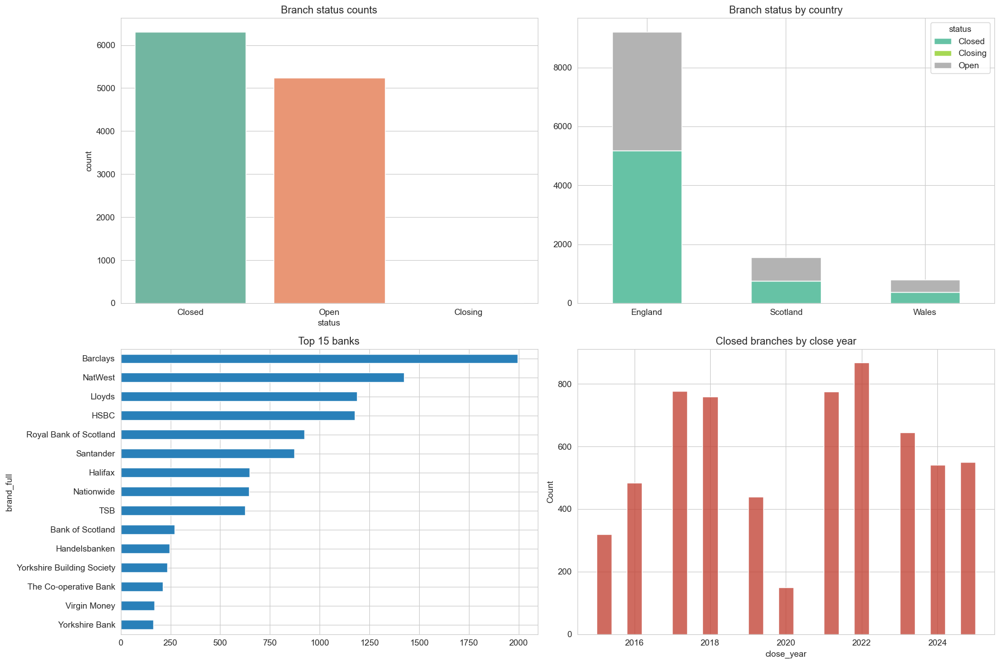

In [5]:
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
sns.countplot(data=df, x="status", order=df["status"].value_counts().index, ax=axes[0,0], palette="Set2")
axes[0,0].set_title("Branch status counts")
pd.crosstab(df["country"], df["status"]).plot(kind="bar", stacked=True, ax=axes[0,1], colormap="Set2")
axes[0,1].set_title("Branch status by country")
axes[0,1].set_xlabel("")
axes[0,1].tick_params(axis="x", labelrotation=0)
df["brand_full"].value_counts().head(15).sort_values().plot(kind="barh", ax=axes[1,0], color="#2980b9")
axes[1,0].set_title("Top 15 banks")
closed = df[df["status"] == "Closed"]
sns.histplot(closed["close_year"].dropna(), bins=25, ax=axes[1,1], color="#c0392b")
axes[1,1].set_title("Closed branches by close year")
savefig("bank_status_brand_close_year_overview.png")


## 4. Census Distributions: Histograms

Inspect the distribution of census characteristics around branch locations. These distributions describe the neighbourhoods represented in the branch network and may differ from those of all small areas.


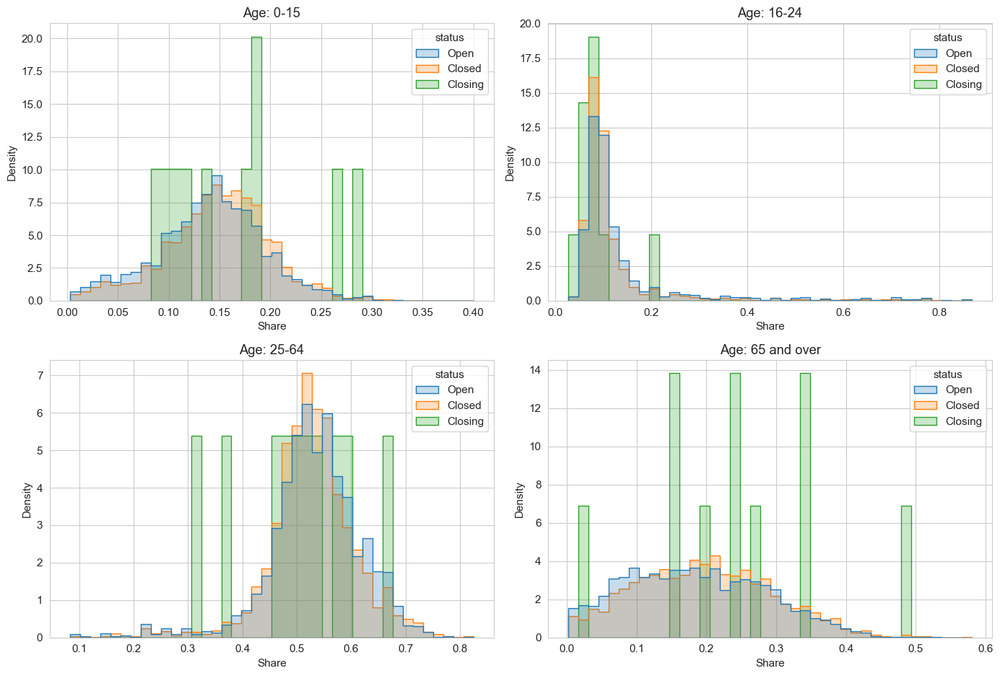

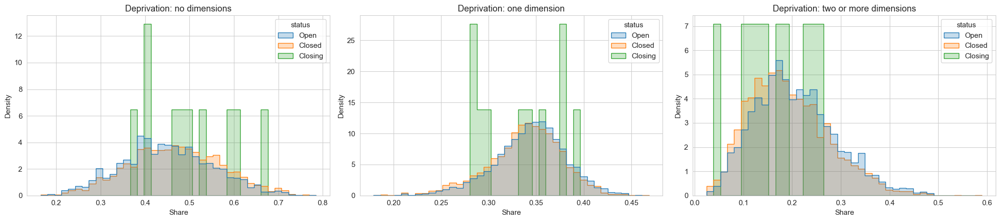

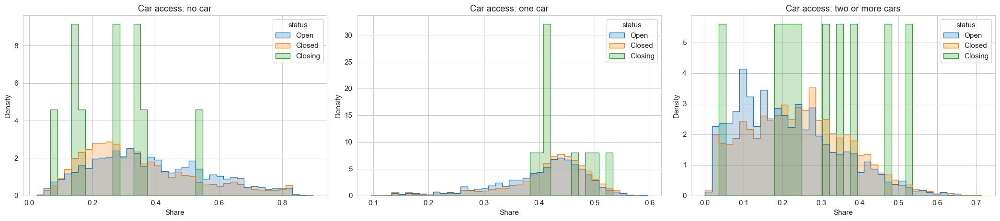

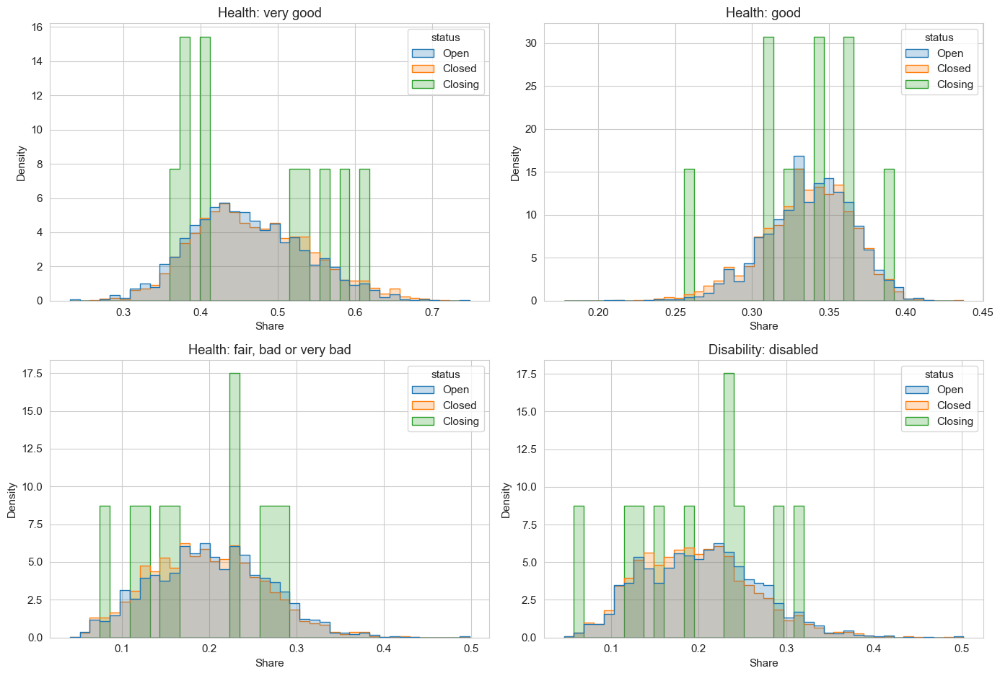

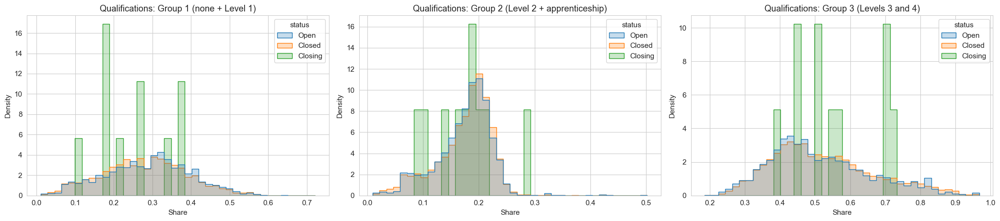

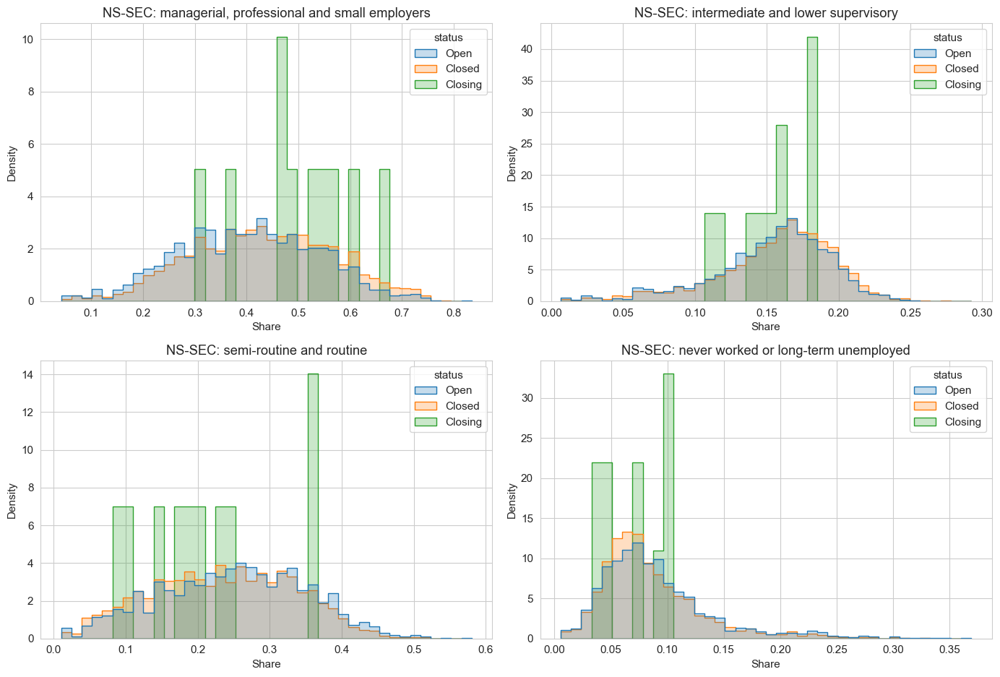

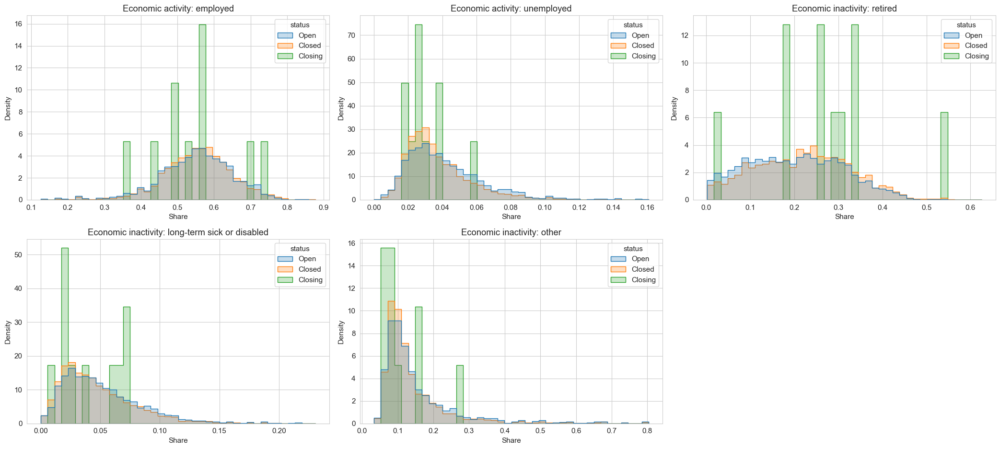

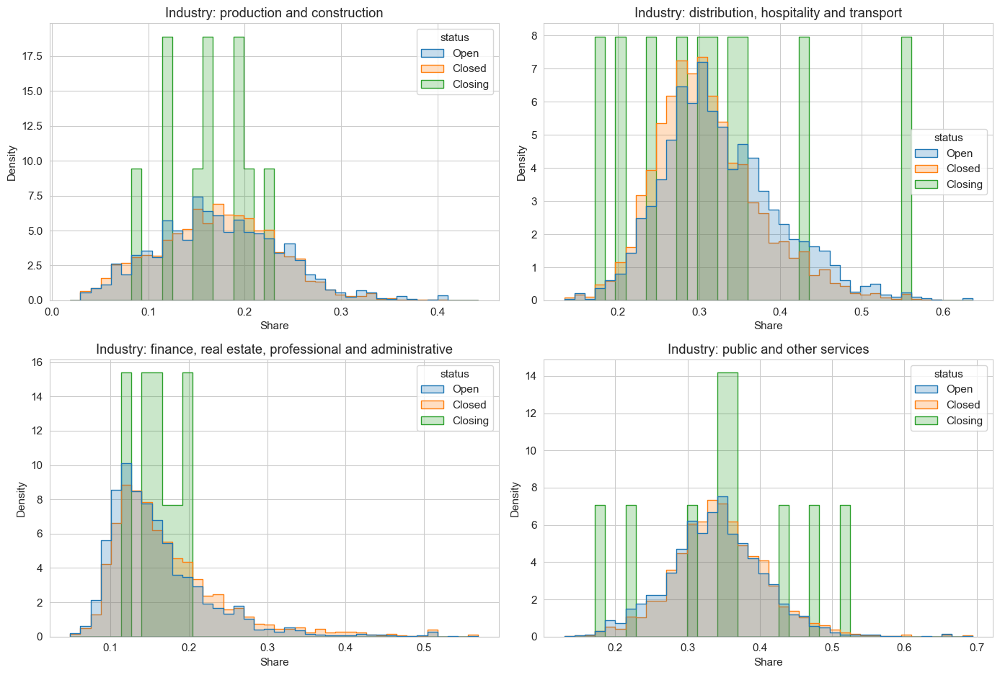

In [6]:
for group_name, vars_ in CENSUS_GROUPS.items():
    n_panels = len(vars_)
    ncols = 3 if n_panels in (3, 5, 6) else 2
    nrows = 1 if n_panels == 3 else 2
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(7 * ncols, 4.75 * nrows), squeeze=False
    )
    axes = axes.ravel()
    for ax, var in zip(axes, vars_):
        sns.histplot(data=df, x=var, hue="status", bins=40, element="step", stat="density", common_norm=False, ax=ax)
        ax.set_title(DISPLAY_LABELS.get(var, var.replace("_", " ")))
        ax.set_xlabel("Share")
        ax.set_ylabel("Density")
    for ax in axes[n_panels:]:
        fig.delaxes(ax)
    savefig(f"bank_census_hist_by_status_{group_name}.png")


## 5. Boxplot for open and close status

Compare census distributions across the three source labels: Open, Closed and Closing. 


population_total         households_total        age_0_15_pct  \
                    mean  median             mean median         mean   
status                                                                  
Closed       1656.378228  1655.0       762.255744  761.0     0.148946   
Closing      1755.000000  1940.5       812.500000  734.5     0.165785   
Open         1648.098798  1637.0       766.304978  765.0     0.141286   

                  age_16_24_pct           age_25_64_pct            \
           median          mean    median          mean    median   
status                                                              
Closed   0.150769      0.124740  0.092662      0.528466  0.527671   
Closing  0.157230      0.087781  0.083430      0.502501  0.509962   
Open     0.143036      0.139602  0.098177      0.533742  0.534731   

        age_65_plus_pct           deprived_0_pct           deprived_1_pct  \
                   mean    median           mean    median           mean   
status                                                                      
Closed         0.197820  0.194827       0.468008  0.466667       0.338653   
Closing        0.244101  0.241707       0.502154  0.485174       0.333625   
Open           0.185350  0.180607       0.450273  0.446632       0.343684   

                  deprived_2_plus_pct           cars_0_pct            \
           median                mean    median       mean    median   
status                                                                 
Closed   0.341280            0.193303  0.182768   0.340792  0.302500   
Closing  0.339789            0.165440  0.161295   0.264615  0.276401   
Open     0.346558            0.206064  0.196502   0.380361  0.352941   

        cars_1_pct           cars_2_plus_pct           health_very_good_pct  \
              mean    median            mean    median                 mean   
status                                                                        
Closed    0.418080  0.433243        0.241128  0.238626             0.467696   
Closing   0.443877  0.418879        0.291508  0.277486             0.475664   
Open      0.406753  0.424036        0.212912  0.194291             0.460273   

                  health_good_pct           health_other_pct            \
           median            mean    median             mean    median   
status                                                                   
Closed   0.460078        0.335396  0.337689         0.196938  0.193991   
Closing  0.465528        0.333290  0.335229         0.191719  0.196177   
Open     0.454054        0.337558  0.339188         0.202204  0.200000   

        disabled_pct           education_low_pct            \
                mean    median              mean    median   
status                                                       
Closed      0.196936  0.193117          0.278154  0.278183   
Closing     0.196192  0.208149          0.250250  0.240043   
Open        0.203103  0.202395          0.287403  0.296261   

        education_middle_pct           education_higher_pct            \
                        mean    median                 mean    median   
status                                                                  
Closed              0.174259  0.185418             0.522062  0.500000   
Closing             0.173539  0.181795             0.551973  0.519359   
Open                0.173514  0.183709             0.513435  0.482664   

        nssec_managerial_professional_small_employers_pct            \
                                                     mean    median   
status                                                                
Closed                                           0.430696  0.430631   
Closing                                          0.501290  0.507578   
Open                                             0.403293  0.406098   

        nssec_intermediate_lower_supervisory_pct            \
                                     

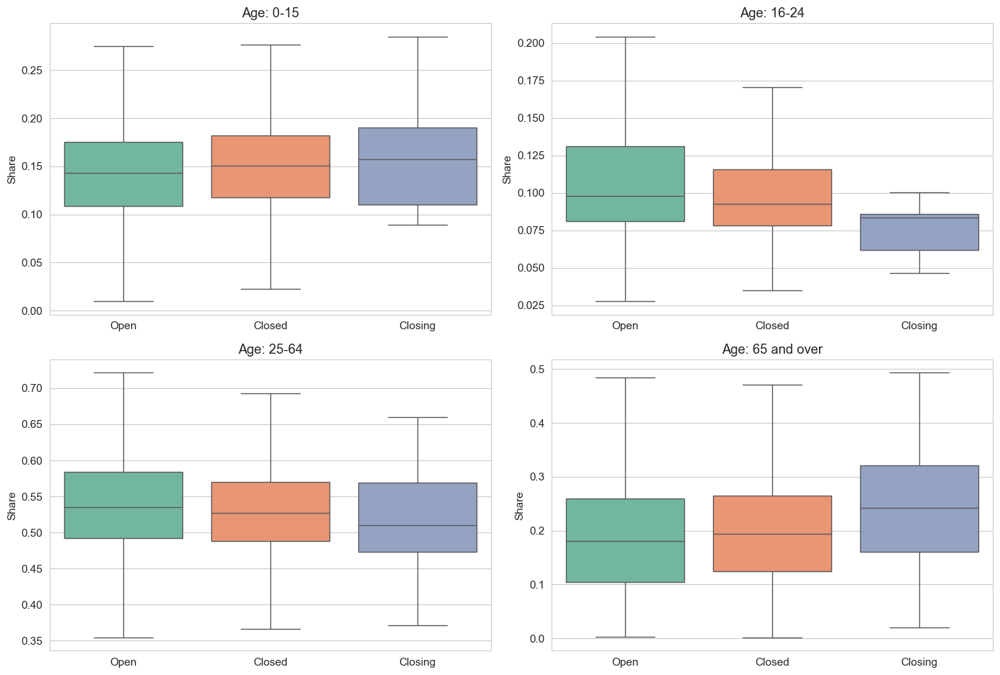

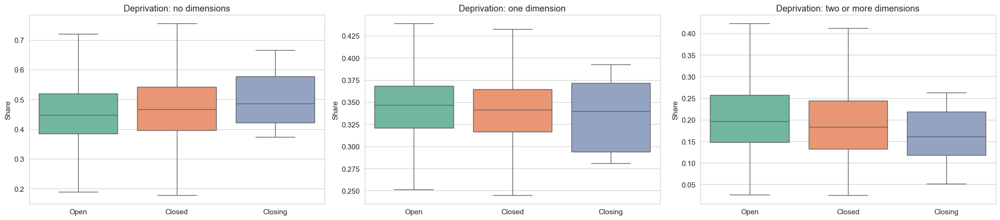

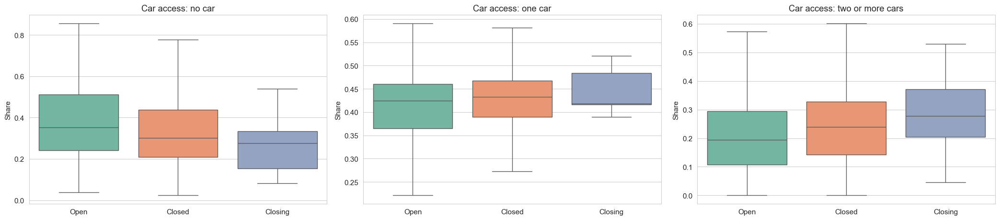

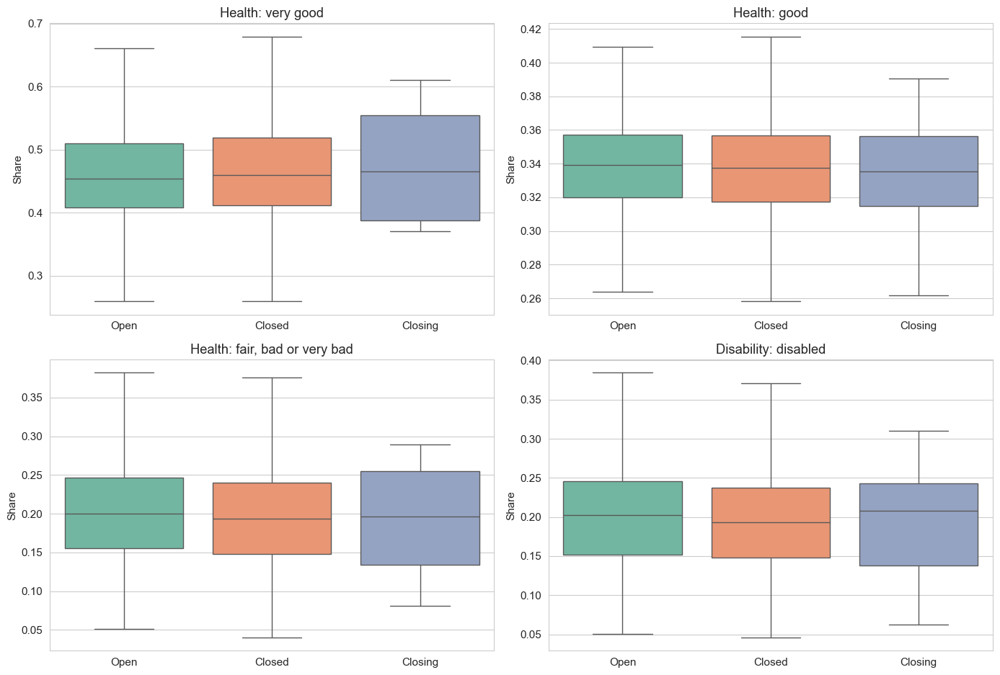

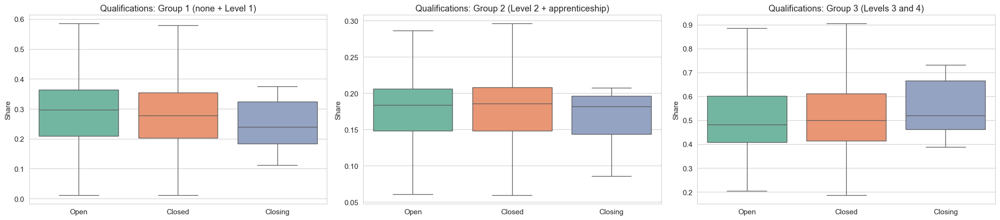

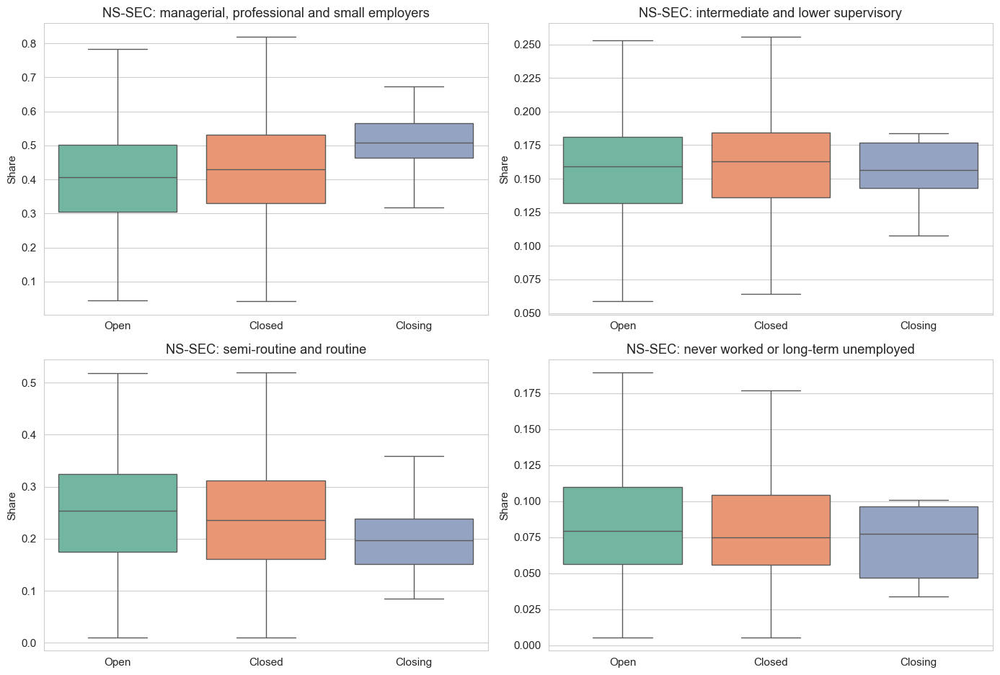

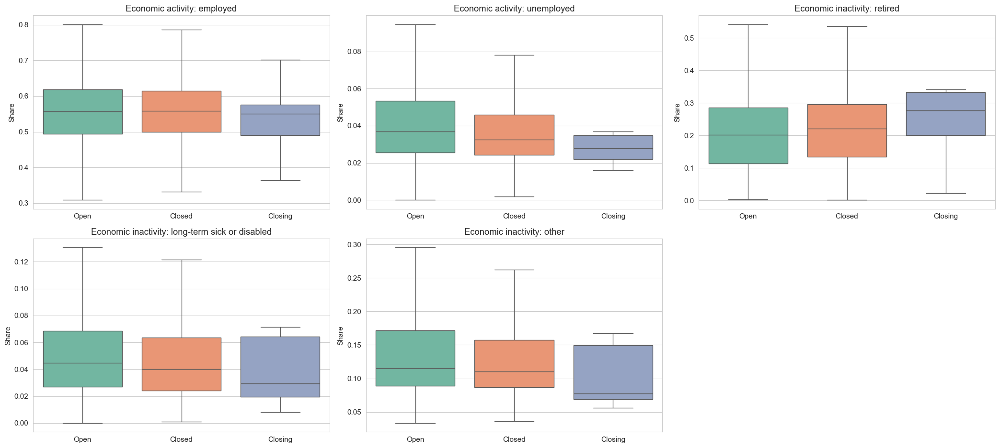

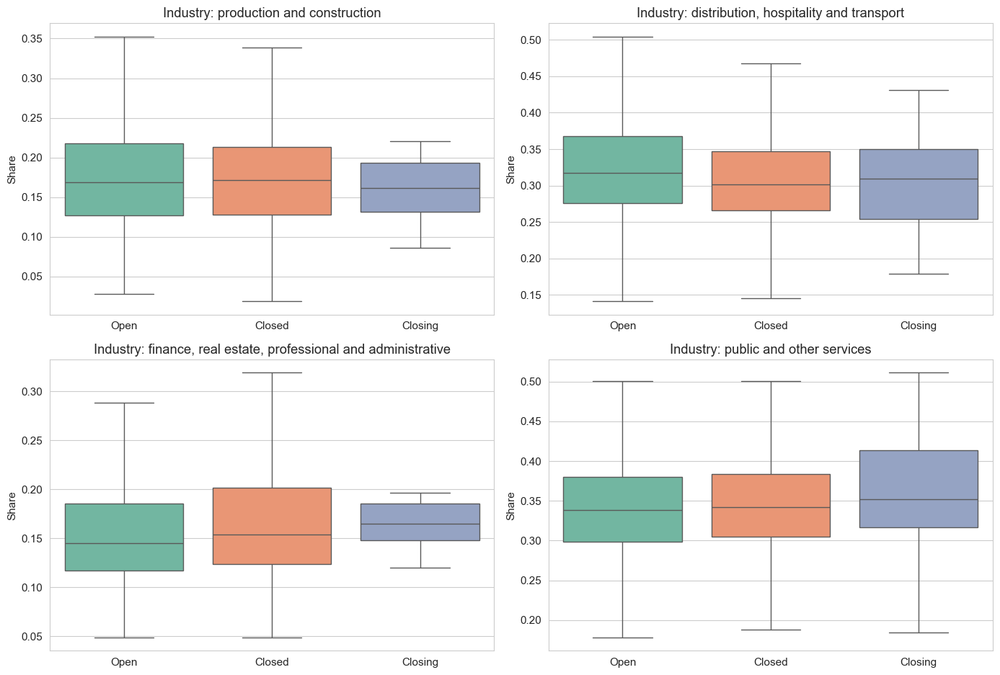

In [7]:
profile = df.groupby("status")[KEY_CENSUS_VARS].agg(["mean", "median"])
display(profile)
profile.to_csv(TABLE_DIR / "bank_census_profile_by_status.csv")

for group_name, vars_ in CENSUS_GROUPS.items():
    n_panels = len(vars_)
    ncols = 3 if n_panels in (3, 5, 6) else 2
    nrows = 1 if n_panels == 3 else 2
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(7 * ncols, 4.75 * nrows), squeeze=False
    )
    axes = axes.ravel()
    for ax, var in zip(axes, vars_):
        sns.boxplot(data=df, x="status", y=var, ax=ax, showfliers=False, palette="Set2")
        ax.set_title(DISPLAY_LABELS.get(var, var.replace("_", " ")))
        ax.set_xlabel("")
        ax.set_ylabel("Share")
    for ax in axes[n_panels:]:
        fig.delaxes(ax)
    savefig(f"bank_census_box_by_status_{group_name}.png")


## 6. Country-Level Census Comparisons Around Branches

Compare the census context of branch records across countries. Differences reflect both neighbourhood composition and the distribution of recorded branches; census years and small-area geographies also differ.


In [8]:
country_profile = df.groupby(["country", "status"])[KEY_CENSUS_VARS].median()
display(country_profile)
country_profile.to_csv(TABLE_DIR / "bank_country_status_census_profile.csv")


population_total  households_total  age_0_15_pct  \
country  status                                                      
England  Closed             1713.0             792.0      0.154603   
         Closing            2039.0             870.5      0.157230   
         Open               1731.0             815.0      0.147465   
Scotland Closed              775.0             398.5      0.130194   
         Closing             594.0             328.0      0.112795   
         Open                775.0             396.0      0.126316   
Wales    Closed             1619.0             765.0      0.156544   
         Closing            1617.0             615.0      0.191095   
         Open               1663.0             779.0      0.148338   

                  age_16_24_pct  age_25_64_pct  age_65_plus_pct  \
country  status                                                   
England  Closed        0.092875       0.531558         0.184353   
         Closing       0.085170       0.529974         0.215666   
         Open          0.101098       0.547059         0.159870   
Scotland Closed        0.090705       0.518219         0.240000   
         Closing       0.060606       0.486532         0.341751   
         Open          0.084399       0.514050         0.260288   
Wales    Closed        0.091877       0.500819         0.229529   
         Closing       0.066172       0.499691         0.243043   
         Open          0.096876       0.509359         0.215900   

                  deprived_0_pct  deprived_1_pct  deprived_2_plus_pct  \
country  status                                                         
England  Closed         0.473177        0.341340             0.178914   
         Closing        0.485174        0.339789             0.161295   
         Open           0.451178        0.344262             0.192920   
Scotland Closed         0.435298        0.340510             0.206349   
         Closing        0.405488        0.378049             0.228659   
         Open           0.442822        0.351706             0.195055   
Wales    Closed         0.445211        0.343117             0.208843   
         Closing        0.665041        0.282927             0.052033   
         Open           0.418903        0.349166             0.225681   

                  cars_0_pct  cars_1_pct  cars_2_plus_pct  \
country  status                                             
England  Closed     0.305426    0.431373         0.237358   
         Closing    0.301272    0.418879         0.277486   
         Open       0.383363    0.418678         0.178523   
Scotland Closed     0.332130    0.441537         0.206304   
         Closing    0.280488    0.521341         0.198171   
         Open       0.270833    0.442577         0.261510   
Wales    Closed     0.242940    0.439861         0.301961   
         Closing    0.081169    0.389610         0.529221   
         Open       0.296247    0.433278         0.249286   

                  health_very_good_pct  health_good_pct  health_other_pct  \
country  status                                                             
England  Closed               0.465935         0.340951          0.186819   
         Closing              0.465528         0.340721          0.196177   
         Open                 0.458552         0.344361          0.190161   
Scotland Closed               0.440961         0.319998          0.234898   
         Closing              0.405724         0.329966          0.271044   
         Open                 0.445652         0.320946          0.227021   
Wales    Closed               0.435242         0.326897          0.229883   
         Closing              0.590123         0.261728          0.148148   
         Open                 0.427736         0.327756          0.236338   

                  disabled_pct  education_low_pct  education_middle_pct  \
country  status                                                           
England  Closed       0.182635     

## 7. Correlation Heatmap

Inspect pairwise associations among the census features. 


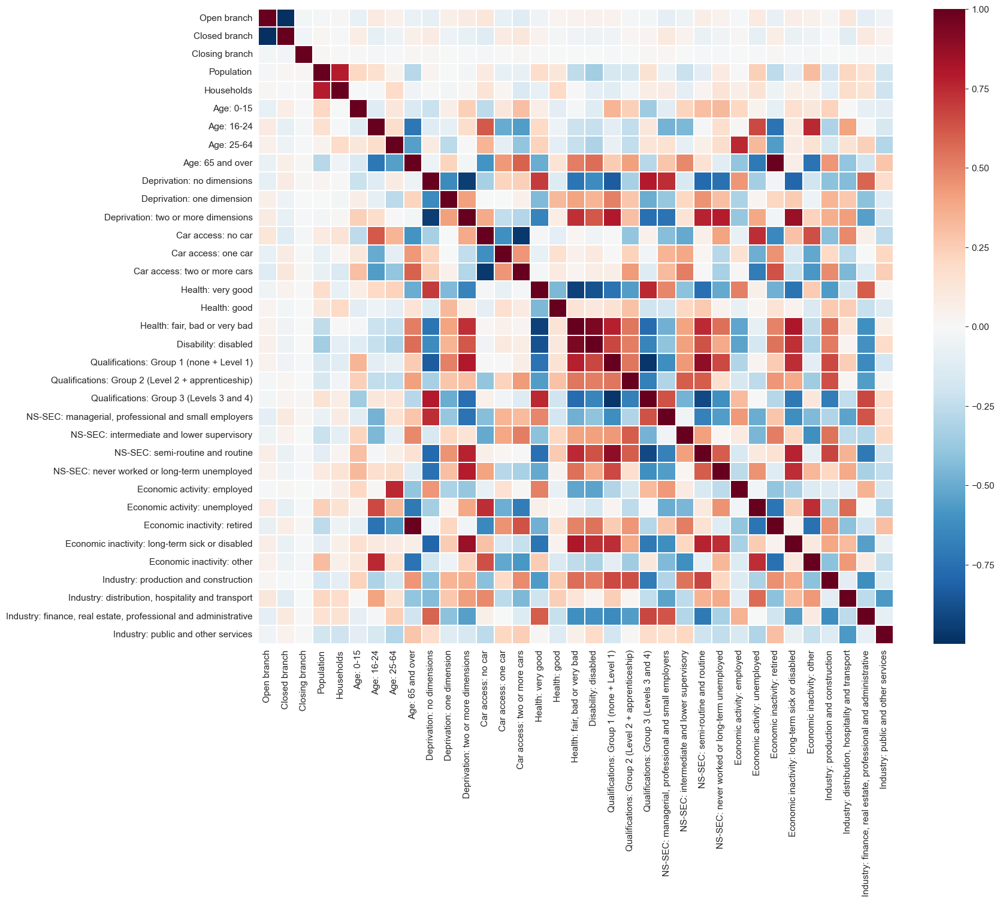

,is_open,is_closed
is_closed,-0.998257,1.000000
cars_2_plus_pct,-0.118534,0.117718
industry_finance_real_estate_professional_admin_pct,-0.096024,0.095637
nssec_managerial_professional_small_employers_pct,-0.095856,0.094740
deprived_0_pct,-0.086176,0.085497
cars_1_pct,-0.081686,0.081170
age_0_15_pct,-0.077319,0.076970
inactive_retired_pct,-0.075278,0.074401
age_65_plus_pct,-0.063180,0.062419
nssec_intermediate_lower_supervisory_pct,-0.046544,0.046779


In [9]:
corr_cols = ["is_open", "is_closed", "is_closing"] + KEY_CENSUS_VARS
corr = df[corr_cols].corr(method="spearman")
corr_plot = corr.rename(index=DISPLAY_LABELS, columns=DISPLAY_LABELS)
fig, ax = plt.subplots(figsize=(18, 15))
sns.heatmap(corr_plot, cmap="RdBu_r", center=0, square=True, linewidths=0.2, ax=ax)
savefig("bank_census_correlation_heatmap.png")
display(corr[["is_open", "is_closed"]].sort_values("is_closed", ascending=False))
corr.to_csv(TABLE_DIR / "bank_census_status_correlation.csv")


## 8. Shapefile Maps: Banking and Census Variables

Prepare the defined function for geopraphical maps. Read the combined boundary layer and match polygons to census records by area code. Geographic maps show physical locations.


In [10]:
# Optional installation:
# !pip install geopandas pyogrio mapclassify

import geopandas as gpd
from matplotlib.colors import ListedColormap

SHAPEFILE = PROJECT_ROOT / "spatial" / "GB_LSOA_DZ_2022.shp"
if not SHAPEFILE.exists():
    raise FileNotFoundError(f"Missing spatial boundary file: {SHAPEFILE}")
print("Shapefile:", SHAPEFILE)

MAP_CRS = "EPSG:27700"
MAP_CACHE = OUTPUT_DIR / "gb_lsoa_dz_2022_plot_simplified_18m.gpkg"
CODE_CANDIDATES = ["geo_code", "area_code", "LSOA21CD", "DZ_CODE", "DataZone", "code"]
COUNTRY_FROM_CODE = {"E": "England", "W": "Wales", "S": "Scotland"}

if MAP_CACHE.exists():
    gdf = gpd.read_file(MAP_CACHE)
else:
    gdf_raw = gpd.read_file(SHAPEFILE)
    geo_code_col = next((c for c in CODE_CANDIDATES if c in gdf_raw.columns), None)
    if geo_code_col is None:
        raise ValueError("Cannot find geographic code column. Please inspect gdf.columns.")
    gdf = gdf_raw[[geo_code_col, "geometry"]].rename(columns={geo_code_col: "area_code"}).copy()
    if gdf.crs is not None and gdf.crs.to_string() != MAP_CRS:
        gdf = gdf.to_crs(MAP_CRS)
    # Simplify boundaries to speed up repeated maps.
    gdf["geometry"] = gdf.geometry.simplify(18, preserve_topology=True)
    try:
        gdf.to_file(MAP_CACHE, driver="GPKG")
    except Exception as exc:
        print(f"Map cache was not written; continuing without cache ({exc})")

gdf["map_country"] = gdf["area_code"].astype(str).str[0].map(COUNTRY_FROM_CODE)

LAND_BACKGROUND = "#ffffff"
LAND_ALT_BACKGROUND = "#ffffff"
CITY_BACKGROUND_CMAP = ListedColormap([LAND_BACKGROUND, LAND_ALT_BACKGROUND])
BORDER_COLOUR = "#000000"
CITY_BORDER_COLOUR = "#000000"
MISSING_COLOUR = "#ffffff"
DATA_EDGE = "#ffffff"
POSITIVE_COLOUR = "#c43c4a"
BINARY_CMAP = ListedColormap([POSITIVE_COLOUR])
CITY_WINDOWS = {
    "London": (500000, 565000, 155000, 205000),
    "Manchester": (372000, 398000, 382000, 408000),
    "Birmingham": (392000, 423000, 270000, 300000),
    "Glasgow-Edinburgh": (250000, 340000, 650000, 690000),
}


def style_map_axis(ax):
    ax.set_facecolor("white")
    ax.set_axis_off()


def set_extent(ax, gdf_extent, pad=0.035):
    if gdf_extent.empty:
        return
    minx, miny, maxx, maxy = gdf_extent.total_bounds
    dx = max(maxx - minx, 1)
    dy = max(maxy - miny, 1)
    ax.set_xlim(minx - dx * pad, maxx + dx * pad)
    ax.set_ylim(miny - dy * pad, maxy + dy * pad)


def plot_base(ax, base_gdf=None, linewidth=0.035, city_style=False):
    base = gdf if base_gdf is None else base_gdf
    if base.empty:
        return
    # White areas provide geographic context.
    base.plot(
        ax=ax, color="white", edgecolor=BORDER_COLOUR,
        linewidth=linewidth, alpha=1.0, zorder=1,
    )

def plot_selection_outline(ax, base_gdf, linewidth=0.45):
    """Draw a very light outer boundary from selected shapefile polygons."""
    if base_gdf.empty:
        return
    try:
        outline_geom = base_gdf.geometry.union_all()
    except AttributeError:
        outline_geom = base_gdf.geometry.unary_union
    gpd.GeoSeries([outline_geom], crs=base_gdf.crs).boundary.plot(
        ax=ax, color=CITY_BORDER_COLOUR, linewidth=linewidth, alpha=0.75, zorder=5
    )

def plot_choropleth_grid(gdf_plot, variables, titles=None, cmaps=None, filename="map_grid.png", ncols=None, focus_on_data=True):
    titles = titles or variables
    cmaps = cmaps or ["viridis"] * len(variables)
    n = len(variables)
    ncols = 3 if n in (3, 5, 6) else 2
    nrows = 1 if n == 3 else 2
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(7 * ncols, 6.2 * nrows),
        squeeze=False, facecolor="white"
    )
    axes = axes.ravel()
    for ax, var, title, cmap in zip(axes, variables, titles, cmaps):
        style_map_axis(ax)
        valid = gdf_plot[gdf_plot[var].notna()].copy()
        plot_base(ax)
        if len(valid):
            unique_values = valid[var].dropna().unique()
            numeric_unique = pd.to_numeric(pd.Series(unique_values), errors="coerce")
            is_binary = len(unique_values) <= 2 and numeric_unique.notna().all() and set(numeric_unique.round(6)).issubset({0.0, 1.0})
            plot_kwargs = {
                "column": var,
                "ax": ax,
                "legend": True,
                "linewidth": 0.045,
                "edgecolor": DATA_EDGE,
                "missing_kwds": {"color": MISSING_COLOUR, "label": "Missing"},
                "zorder": 2,
            }
            if is_binary:
                positive = valid[pd.to_numeric(valid[var], errors="coerce") > 0].copy()
                if len(positive):
                    positive.plot(color=POSITIVE_COLOUR, **{k: v for k, v in plot_kwargs.items() if k not in ["column", "cmap", "legend"]})
            else:
                valid.plot(cmap=cmap, scheme="quantiles" if valid[var].nunique(dropna=True) > 5 else None, **plot_kwargs)
            if focus_on_data:
                set_extent(ax, valid)
        ax.set_title(DISPLAY_LABELS.get(title, str(title).replace("_", " ")), fontsize=12.5, fontweight="bold")
    for ax in axes[n:]:
        fig.delaxes(ax)
    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=170, bbox_inches="tight", facecolor="white")
    plt.show()


def plot_country_choropleths(gdf_plot, var, title, cmap, filename):
    countries = ["England", "Wales", "Scotland"]
    fig, axes = plt.subplots(1, 3, figsize=(23, 8.5), facecolor="white", gridspec_kw={"width_ratios": [2.2, 0.85, 1.35]})
    for ax, country in zip(axes, countries):
        style_map_axis(ax)
        base = gdf[gdf["map_country"] == country]
        sub = gdf_plot[(gdf_plot["map_country"] == country) & gdf_plot[var].notna()].copy()
        plot_base(ax, base_gdf=base, linewidth=0.06)
        if len(sub):
            unique_values = sub[var].dropna().unique()
            numeric_unique = pd.to_numeric(pd.Series(unique_values), errors="coerce")
            is_binary = len(unique_values) <= 2 and numeric_unique.notna().all() and set(numeric_unique.round(6)).issubset({0.0, 1.0})
            if is_binary:
                positive = sub[pd.to_numeric(sub[var], errors="coerce") > 0].copy()
                if len(positive):
                    positive.plot(ax=ax, color=POSITIVE_COLOUR, legend=False, linewidth=0.035, edgecolor=DATA_EDGE, zorder=2)
            else:
                sub.plot(column=var, ax=ax, cmap=cmap, legend=True, linewidth=0.055, edgecolor=DATA_EDGE, scheme="quantiles" if sub[var].nunique(dropna=True) > 5 else None, zorder=2)
        set_extent(ax, sub if len(sub) else base, pad=0.045)
        ax.set_title(country, fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=170, bbox_inches="tight", facecolor="white")
    plt.show()


def plot_city_choropleth_insets(gdf_plot, var, title, cmap, filename):
    fig, axes = plt.subplots(2, 2, figsize=(13.5, 11.5), facecolor="white")
    for ax, (city, (minx, maxx, miny, maxy)) in zip(axes.flat, CITY_WINDOWS.items()):
        style_map_axis(ax)
        base = gdf.cx[minx:maxx, miny:maxy].copy()
        sub = gdf_plot.cx[minx:maxx, miny:maxy]
        sub = sub[sub[var].notna()].copy()
        plot_base(ax, base_gdf=base, linewidth=0.035, city_style=True)
        if len(sub):
            unique_values = sub[var].dropna().unique()
            numeric_unique = pd.to_numeric(pd.Series(unique_values), errors="coerce")
            is_binary = len(unique_values) <= 2 and numeric_unique.notna().all() and set(numeric_unique.round(6)).issubset({0.0, 1.0})
            if is_binary:
                positive = sub[pd.to_numeric(sub[var], errors="coerce") > 0].copy()
                if len(positive):
                    positive.plot(ax=ax, color=POSITIVE_COLOUR, linewidth=0.04, edgecolor=DATA_EDGE, alpha=0.92, zorder=3)
            else:
                sub.plot(column=var, ax=ax, cmap=cmap, scheme="quantiles" if sub[var].nunique(dropna=True) > 5 else None, legend=False, linewidth=0.04, edgecolor=DATA_EDGE, alpha=0.88, zorder=3)
        plot_selection_outline(ax, base, linewidth=0.45)
        ax.set_xlim(minx, maxx)
        ax.set_ylim(miny, maxy)
        ax.set_title(city, fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.savefig(FIG_DIR / filename, dpi=210, bbox_inches="tight", facecolor="white")
    plt.show()


branch_points = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df["long_wgs84"], df["lat_wgs84"]),
    crs="EPSG:4326",
)
if gdf.crs is not None and branch_points.crs != gdf.crs:
    branch_points_plot = branch_points.to_crs(gdf.crs)
else:
    branch_points_plot = branch_points
branch_points_plot["map_country"] = branch_points_plot["area_code"].astype(str).str[0].map(COUNTRY_FROM_CODE)
STATUS_STYLE = {
    "Open": {"color": "#2166ac", "size": 7, "alpha": 0.62, "zorder": 3},
    "Closed": {"color": "#b2182b", "size": 6, "alpha": 0.62, "zorder": 4},
    "Closing": {"color": "#f4a582", "size": 28, "alpha": 0.95, "zorder": 5},
}
print("branch points:", branch_points_plot.shape)

Shapefile: C:\Users\liwen\Documents\ERP Topological data science\材料提交\Additional_Materials_Submission\spatial\GB_LSOA_DZ_2022.shp
branch points: (11564, 156)


### 8.1 Branch Point Maps

Plot individual branch locations by recorded status. Urban detail helps separate records that overlap or become hard to distinguish on the national map.


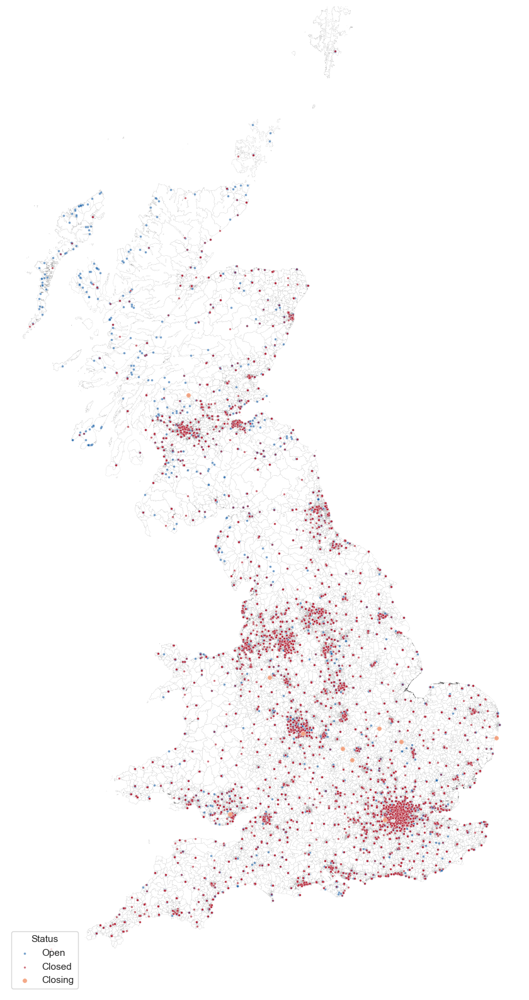

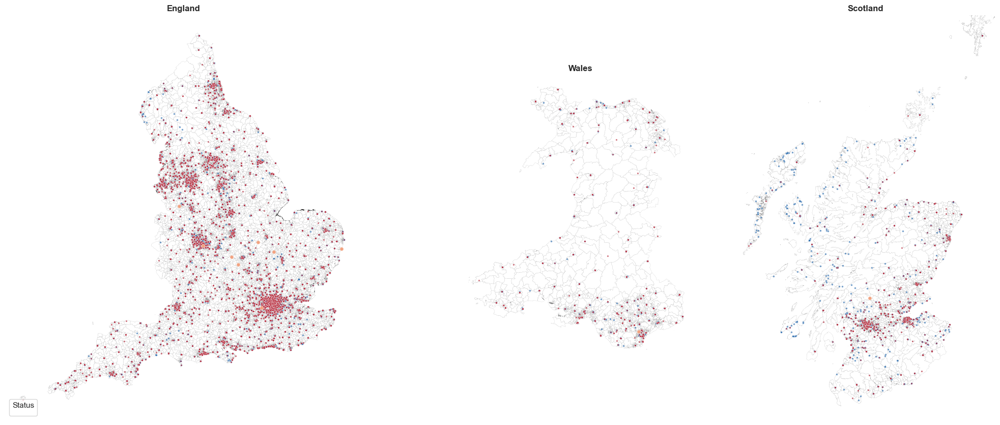

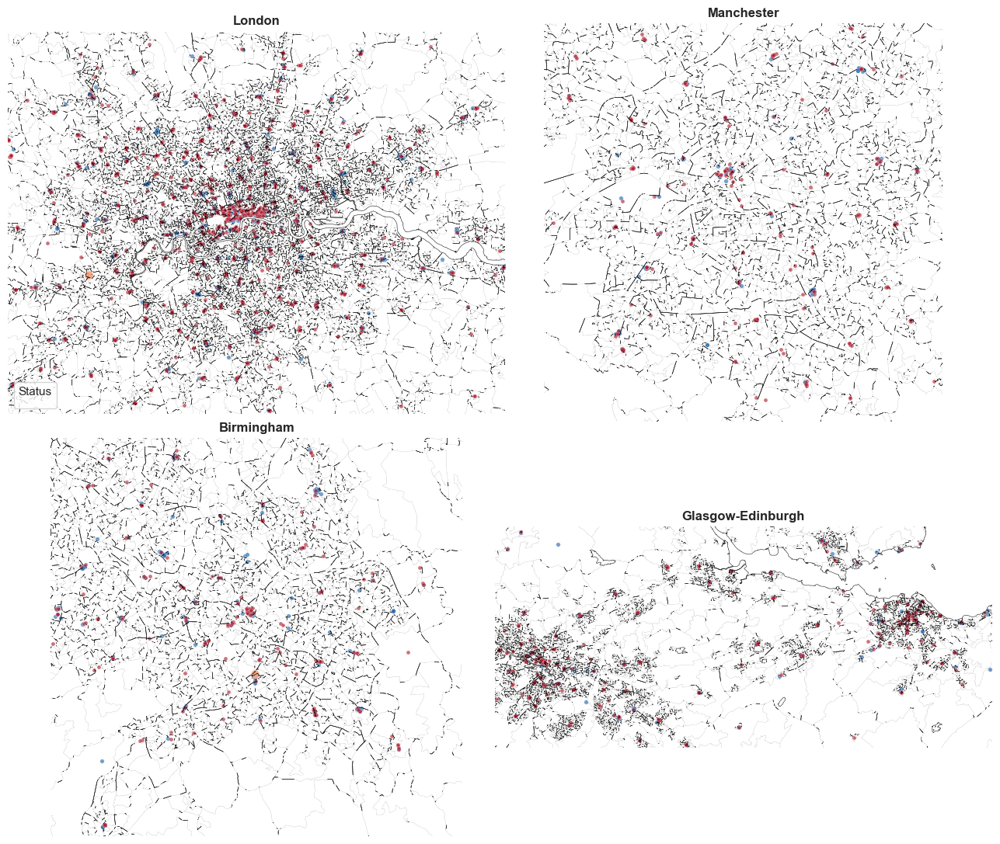

In [11]:
def plot_branch_points_layer(ax, base_gdf, pts, point_scale=1.0, base_linewidth=0.035, show_labels=True):
    plot_base(ax, base_gdf=base_gdf, linewidth=0.04 if base_linewidth >= 0.07 else base_linewidth, city_style=base_linewidth >= 0.07)
    for status, style in STATUS_STYLE.items():
        sub = pts[pts["status"] == status]
        if len(sub):
            sub.plot(
                ax=ax,
                markersize=style["size"] * point_scale,
                color=style["color"],
                alpha=style["alpha"],
                label=status if show_labels else None,
                zorder=style["zorder"],
                edgecolor="white",
                linewidth=0.28,
            )

fig, ax = plt.subplots(figsize=(13, 16), facecolor="white")
style_map_axis(ax)
plot_branch_points_layer(ax, gdf, branch_points_plot, point_scale=1.0)
set_extent(ax, branch_points_plot, pad=0.05)
ax.legend(title="Status", frameon=True, facecolor="white", loc="lower left")
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_map_branch_points_gb.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()

fig, axes = plt.subplots(1, 3, figsize=(23, 8.5), facecolor="white", gridspec_kw={"width_ratios": [2.2, 0.85, 1.35]})
for ax, country in zip(axes, ["England", "Wales", "Scotland"]):
    style_map_axis(ax)
    base = gdf[gdf["map_country"] == country]
    pts = branch_points_plot[branch_points_plot["map_country"] == country]
    plot_branch_points_layer(ax, base, pts, point_scale=0.95, base_linewidth=0.045, show_labels=False)
    set_extent(ax, pts if len(pts) else base, pad=0.055)
    ax.set_title(country, fontsize=12, fontweight="bold")
axes[0].legend(title="Status", frameon=True, facecolor="white", loc="lower left")
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_map_branch_points_by_country.png", dpi=180, bbox_inches="tight", facecolor="white")
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(13, 11), facecolor="white")
for ax, (city, (minx, maxx, miny, maxy)) in zip(axes.flat, CITY_WINDOWS.items()):
    style_map_axis(ax)
    base = gdf.cx[minx:maxx, miny:maxy]
    pts = branch_points_plot.cx[minx:maxx, miny:maxy]
    plot_branch_points_layer(ax, base, pts, point_scale=2.2, base_linewidth=0.18, show_labels=False)
    plot_selection_outline(ax, base, linewidth=0.45)
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    ax.set_title(city, fontsize=12, fontweight="bold")
axes[0, 0].legend(title="Status", frameon=True, facecolor="white", loc="lower left")
plt.tight_layout()
plt.savefig(FIG_DIR / "bank_map_branch_points_urban_insets.png", dpi=210, bbox_inches="tight", facecolor="white")
plt.show()

### 8.2 Area-Aggregated Branch Maps

Aggregate branch records to their host areas to compare record counts and closed shares. An area with a high closed share may still retain an open branch, so this measure differs from complete withdrawal.


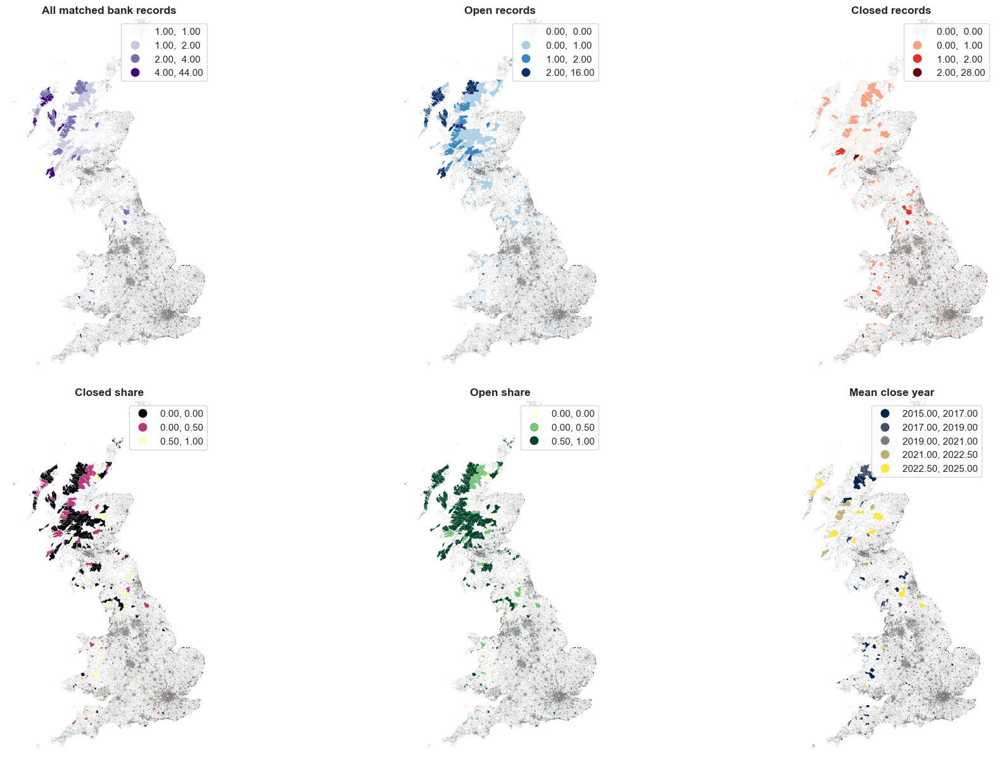

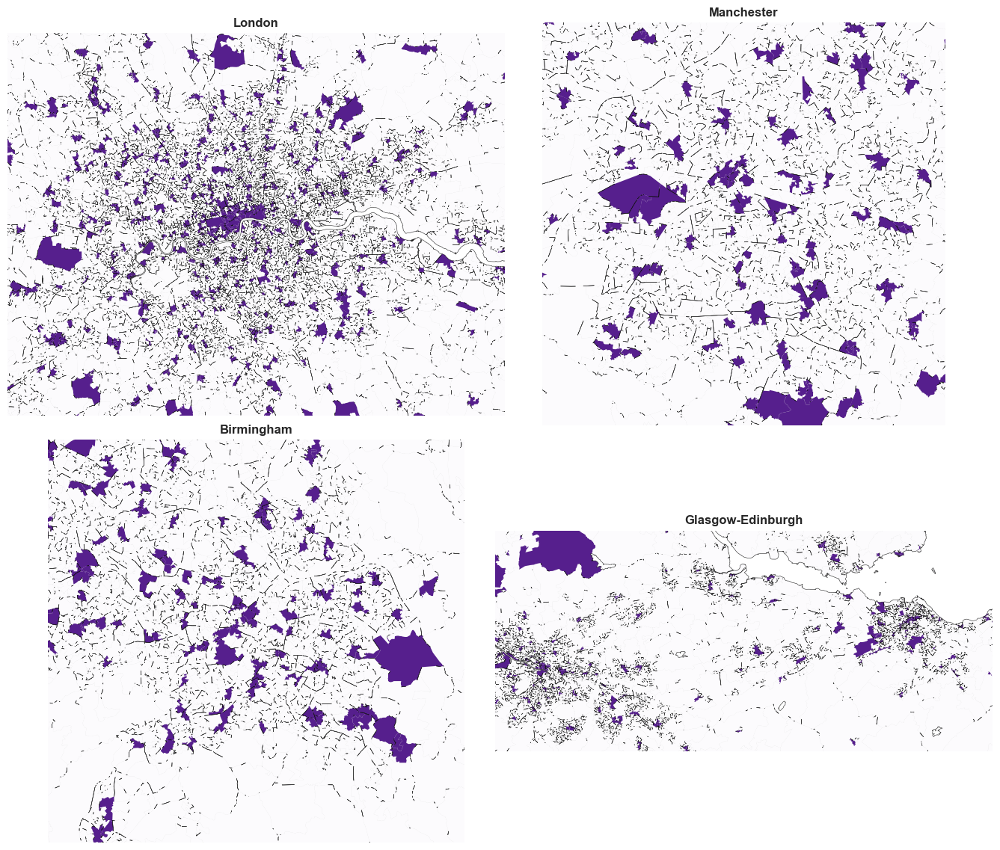

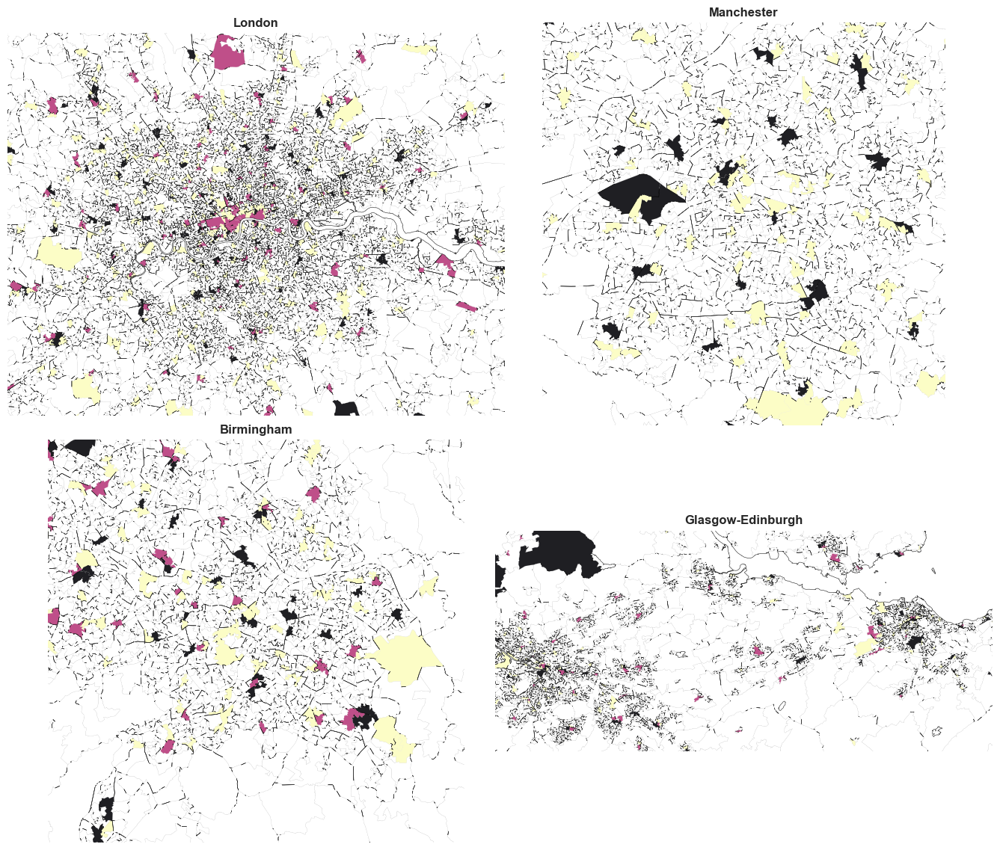

In [12]:
bank_area = df.groupby("area_code").agg(
    bank_records=("id", "size"),
    open_records=("is_open", "sum"),
    closed_records=("is_closed", "sum"),
    closing_records=("is_closing", "sum"),
    mean_close_year=("close_year", "mean"),
    country=("country", "first"),
).reset_index()
bank_area["closed_share"] = np.where(bank_area["bank_records"] > 0, bank_area["closed_records"] / bank_area["bank_records"], np.nan)
bank_area["open_share"] = np.where(bank_area["bank_records"] > 0, bank_area["open_records"] / bank_area["bank_records"], np.nan)
bank_area_map = gdf.merge(bank_area, on="area_code", how="left")
for c in ["bank_records", "open_records", "closed_records", "closing_records"]:
    bank_area_map[c] = bank_area_map[c].fillna(0)

bank_area_focus = bank_area_map[bank_area_map["bank_records"] > 0].copy()
plot_choropleth_grid(
    bank_area_focus,
    ["bank_records", "open_records", "closed_records", "closed_share", "open_share", "mean_close_year"],
    ["All matched bank records", "Open records", "Closed records", "Closed share", "Open share", "Mean close year"],
    ["Purples", "Blues", "Reds", "magma", "YlGn", "cividis"],
    "bank_map_area_aggregated_records.png",
    focus_on_data=True,
)
plot_city_choropleth_insets(bank_area_map, "bank_records", "Urban detail: matched bank records per area", "Purples", "bank_map_urban_bank_records.png")
plot_city_choropleth_insets(bank_area_map, "closed_share", "Urban detail: closed branch share", "magma", "bank_map_urban_closed_share.png")

### 8.3 Census Maps for Areas with Bank Records

Show census characteristics for areas containing matched branch records. Other polygons remain as geographic context rather than additional observations in the branch comparison.


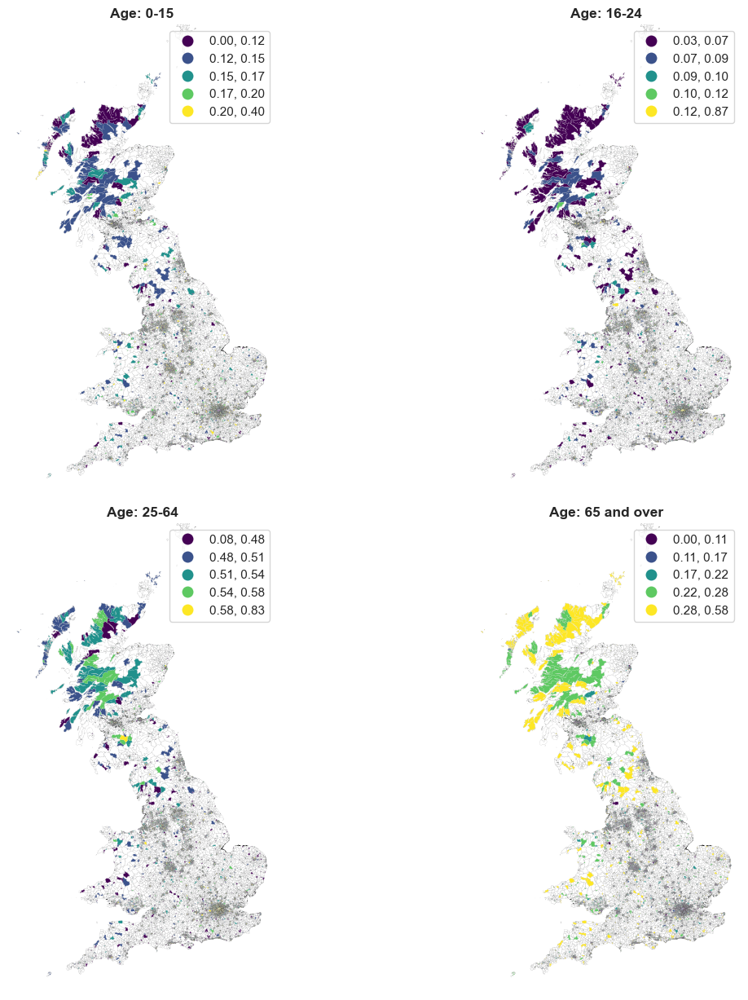

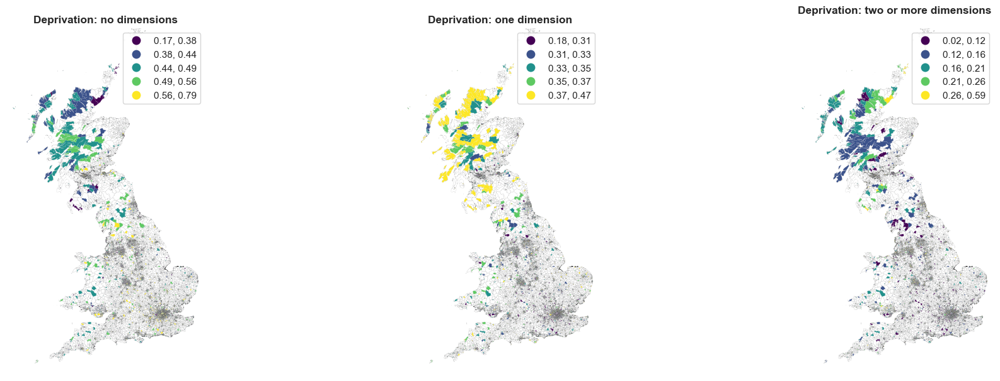

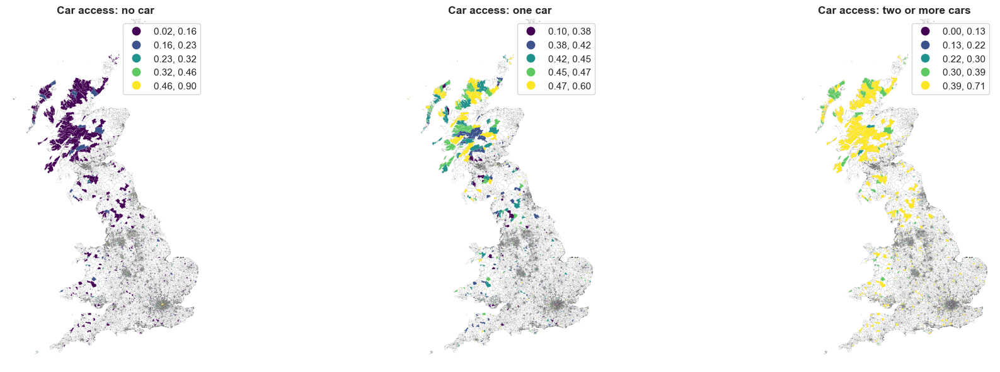

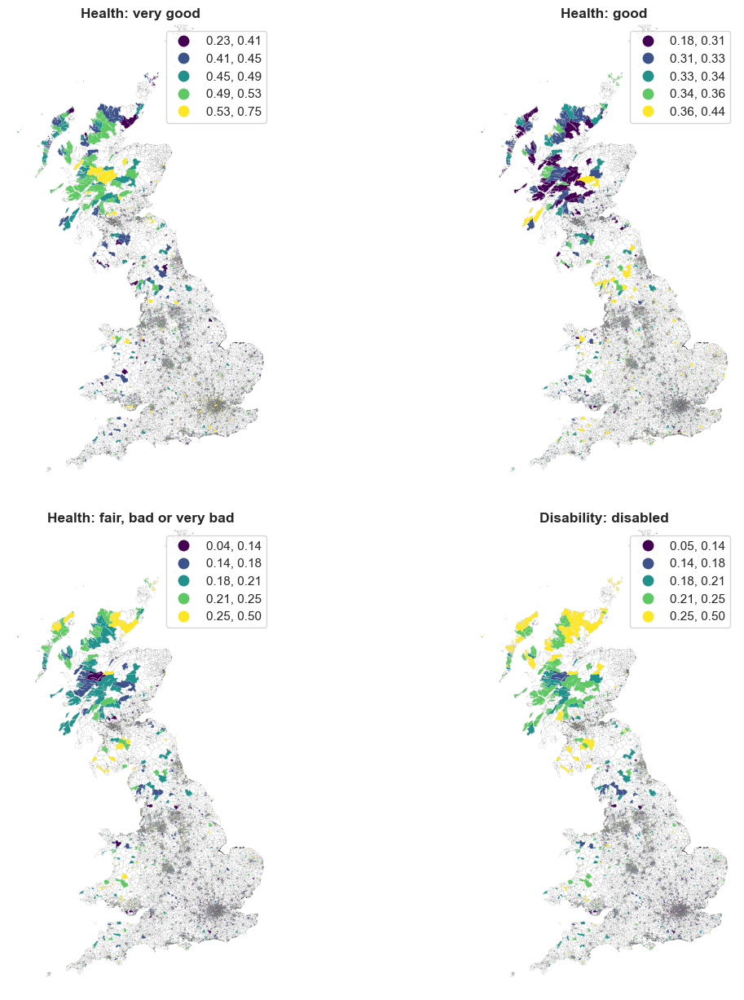

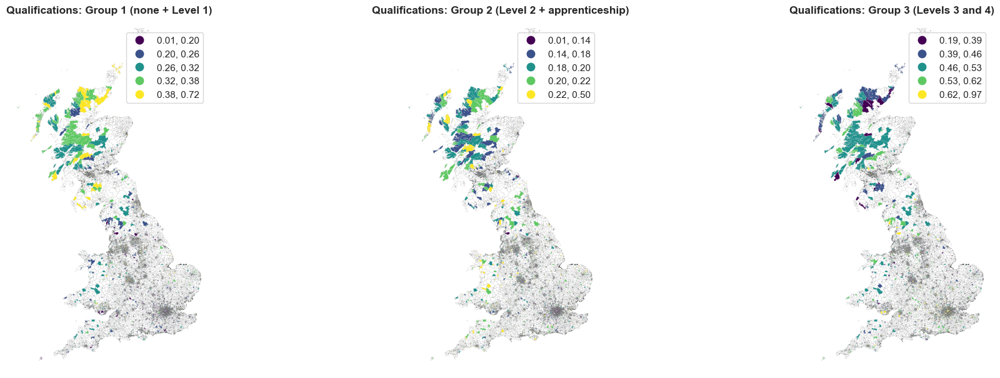

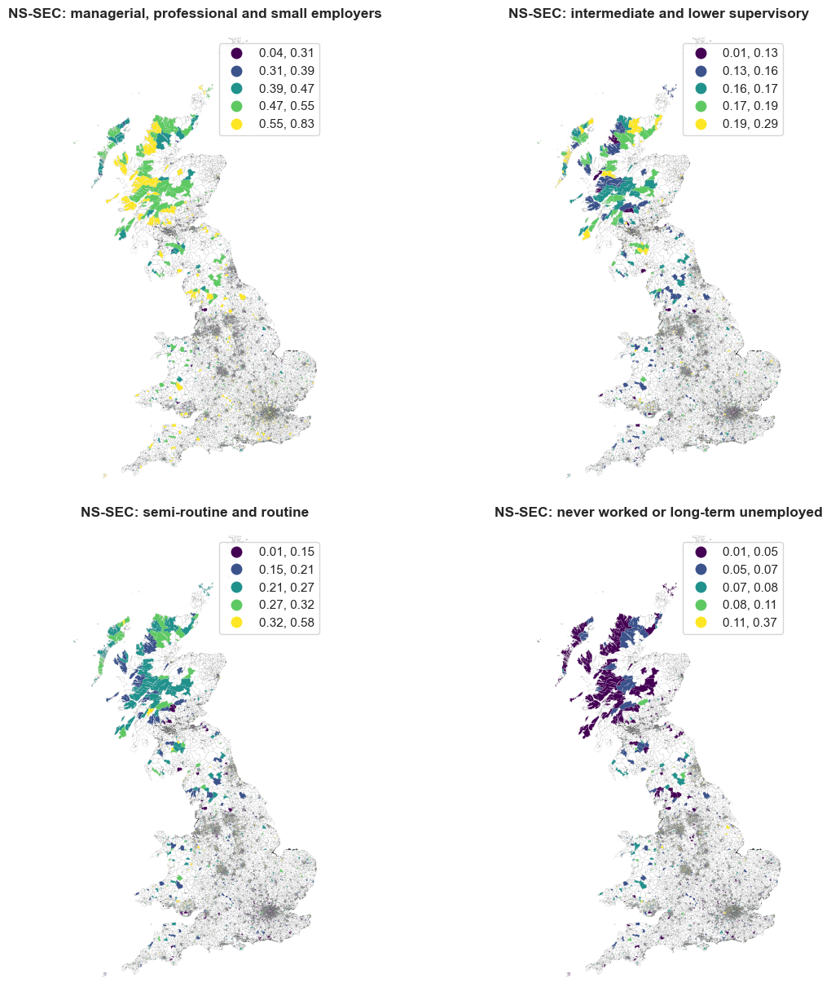

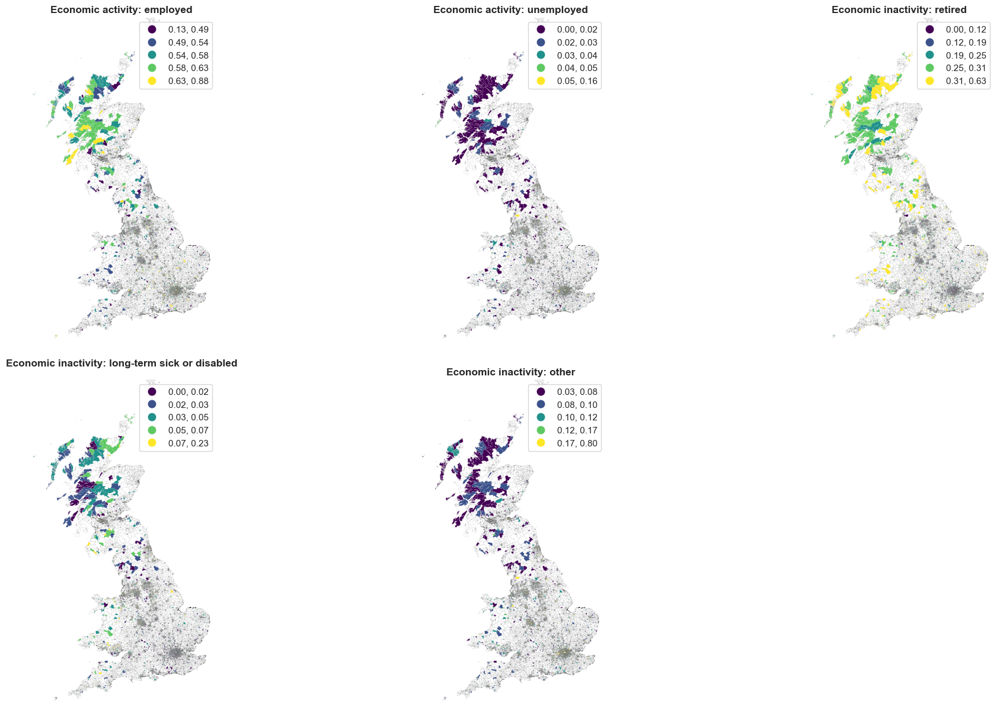

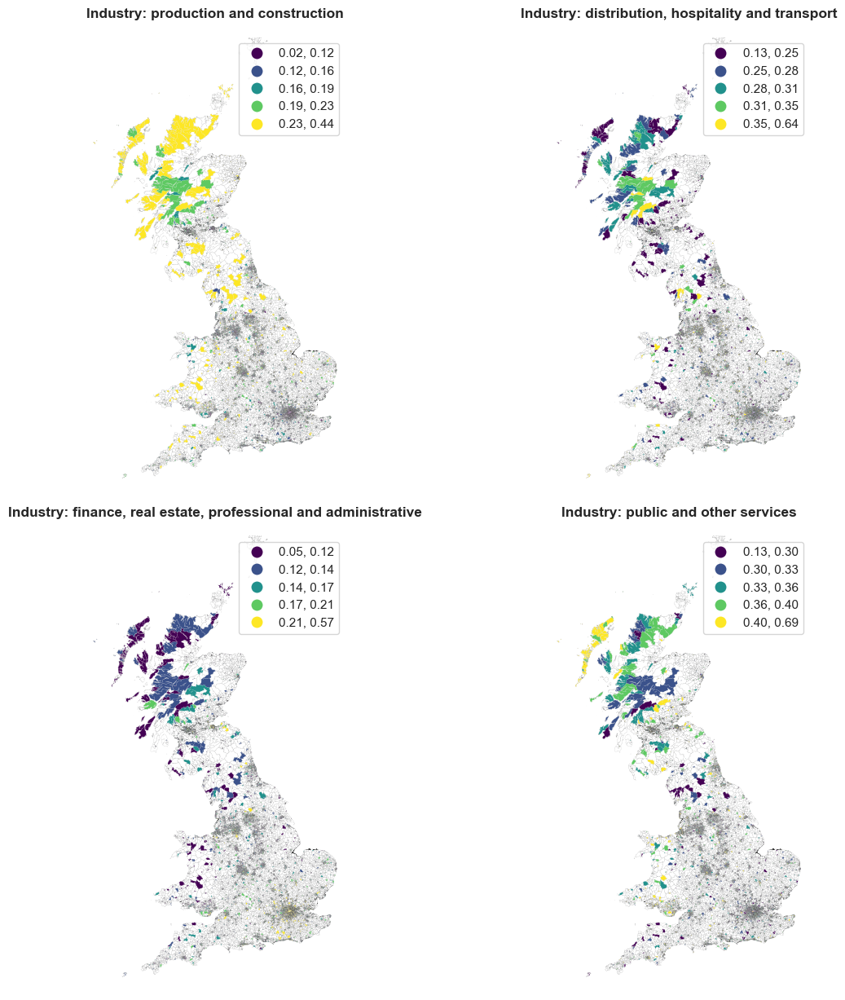

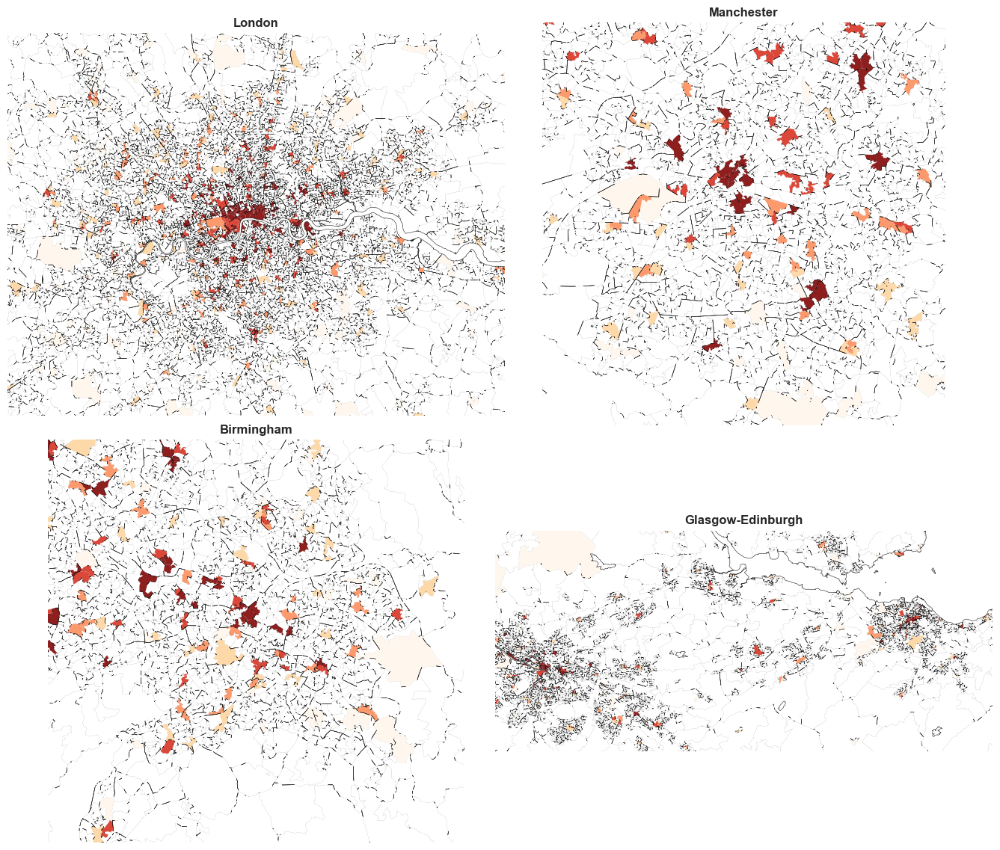

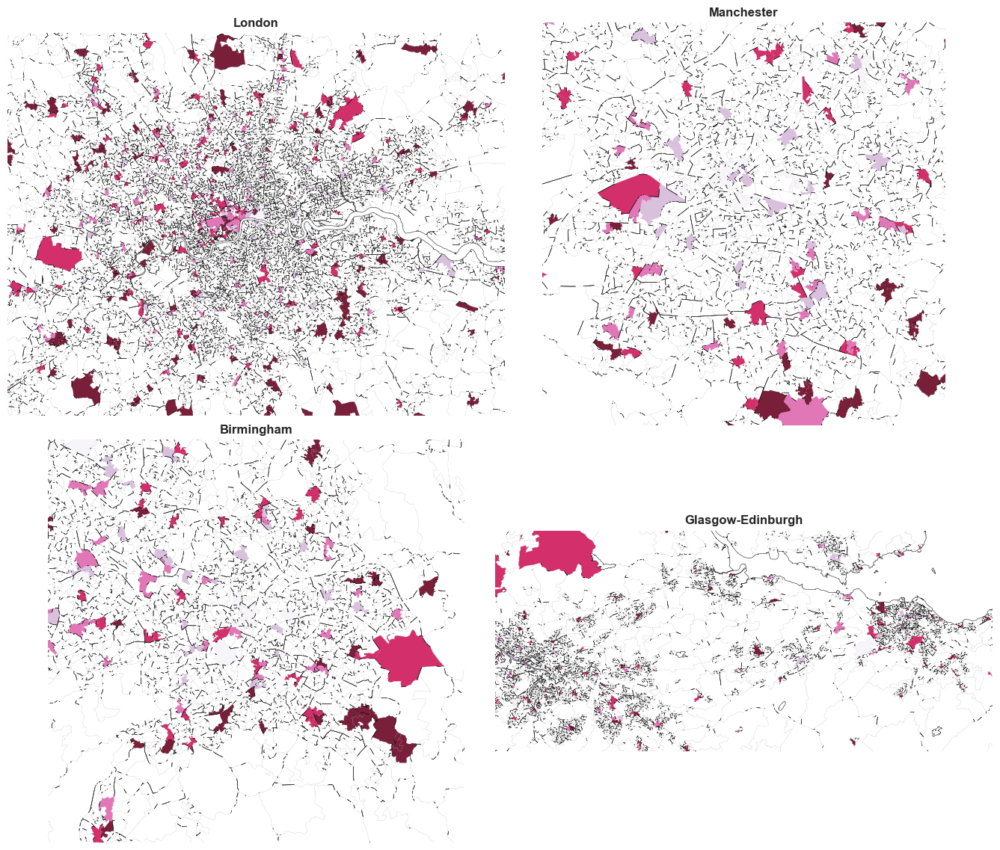

In [13]:
# Highlight areas with matched branches.
branch_context = df.groupby("area_code")[KEY_CENSUS_VARS].first().reset_index()
branch_context_map = gdf.merge(branch_context, on="area_code", how="left")

for group_name, vars_ in CENSUS_GROUPS.items():
    vars_existing = [v for v in vars_ if v in branch_context_map.columns]
    plot_choropleth_grid(
        branch_context_map, vars_existing, titles=vars_existing,
        cmaps=["viridis"] * len(vars_existing),
        filename=f"bank_map_branch_area_census_{group_name}.png",
        focus_on_data=True,
    )

plot_city_choropleth_insets(branch_context_map, "cars_0_pct", "Urban branch-area detail: no-car household share", "OrRd", "bank_map_urban_cars_0_pct.png")
plot_city_choropleth_insets(branch_context_map, "age_65_plus_pct", "Urban branch-area detail: age 65+ share", "PuRd", "bank_map_urban_age_65_plus_pct.png")